In [ ]:
!pip install pymc-marketing

In [1]:
import pymc_marketing

print("pymc-marketing version:", pymc_marketing.__version__)

/Users/Office/Desktop/Projects/MMM library/mmm-library/.venv/lib/python3.12/site-packages/pymc_extras/model/marginal/graph_analysis.py:10: FutureWarning: `pytensor.graph.basic.io_toposort` was moved to `pytensor.graph.traversal.io_toposort`. Calling it from the old location will fail in a future release.
  from pytensor.graph.basic import io_toposort


pymc-marketing version: 0.17.1


/Users/Office/Desktop/Projects/MMM library/mmm-library/.venv/lib/python3.12/site-packages/pymc_marketing/pytensor_utils.py:34: FutureWarning: `pytensor.graph.basic.ancestors` was moved to `pytensor.graph.traversal.ancestors`. Calling it from the old location will fail in a future release.
  from pytensor.graph.basic import ancestors


In [2]:

import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns
import xarray as xr
from pymc_extras.prior import Prior

# from pymc_marketing.metrics import crps
from pymc_marketing.mmm import MMM, GeometricAdstock, LogisticSaturation
from pymc_marketing.mmm.utils import apply_sklearn_transformer_across_dim


warnings.filterwarnings("ignore", category=FutureWarning)

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100


%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

/Users/Office/Desktop/Projects/MMM library/mmm-library/.venv/lib/python3.12/site-packages/pymc_extras/model/marginal/graph_analysis.py:10: FutureWarning: `pytensor.graph.basic.io_toposort` was moved to `pytensor.graph.traversal.io_toposort`. Calling it from the old location will fail in a future release.
  from pytensor.graph.basic import io_toposort
/Users/Office/Desktop/Projects/MMM library/mmm-library/.venv/lib/python3.12/site-packages/pymc_marketing/pytensor_utils.py:34: FutureWarning: `pytensor.graph.basic.ancestors` was moved to `pytensor.graph.traversal.ancestors`. Calling it from the old location will fail in a future release.
  from pytensor.graph.basic import ancestors


## Data Generation

In [77]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pymc_marketing.mmm.transformers import geometric_adstock, logistic_saturation

seed = sum(map(ord, "mmm_blog"))
rng = np.random.default_rng(seed=seed)

# 1. Date range
min_date = pd.to_datetime("2023-01-01")
max_date = pd.to_datetime("2025-12-31")
df = pd.DataFrame(
    data={"date": pd.date_range(start=min_date, end=max_date, freq="W-MON")}
).assign(
    dayofyear=lambda x: x["date"].dt.dayofyear,
)
n = df.shape[0]

# 2. Media Data Generation (3 Channels)
# x1: Sustained awareness (High frequency)
x1 = rng.uniform(low=0.2, high=1.0, size=n)
df["channel1"] = np.where(x1 > 0.7, x1, x1 / 1.5)

# x2: Burst/Promotional (Spiky, many zeros)
x2 = rng.uniform(low=0.0, high=1.0, size=n)
df["channel2"] = np.where(x2 > 0.85, x2, 0)

# x3: Performance/Search (Steady but fluctuating)
df["channel3"] = rng.gamma(shape=2, scale=0.2, size=n)

# 3. Apply Transformations
# Adstock Alphas (0 = no carryover, 1 = total carryover)
alpha1, alpha2, alpha3 = 0.6, 0.2, 0.1 
# Saturation Lambdas (higher = reaches ceiling faster)
lam1, lam2, lam3 = 3.0, 5.0, 6.0

for i, (a, l) in enumerate(zip([alpha1, alpha2, alpha3], [lam1, lam2, lam3]), 1):
    # Adstock
    adstocked = geometric_adstock(x=df[f"channel{i}"].to_numpy(), alpha=a, l_max=8, normalize=True).eval()
    df[f"channel{i}_adstock"] = adstocked.flatten()
    # Saturation
    saturated = logistic_saturation(x=df[f"channel{i}_adstock"].to_numpy(), lam=l).eval()
    df[f"channel{i}_saturated"] = saturated

# 4. Baseline Components (Trend & Seasonality)
df["trend"] = (np.linspace(0, 20, n) + 5) ** (1/2) - 2
df["seasonality"] = 0.4 * np.sin(2 * np.pi * df["dayofyear"] / 365.25)

# 5. Events (Black Friday & Summer Sale)
df["event_bf"] = df["date"].dt.month.eq(11) & df["date"].dt.day.between(20, 30)
df["event_bf"] = df["event_bf"].astype(float)

# Event 2: Summer Sale (Mid-July)
df["event_summer"] = df["date"].dt.month.eq(7) & df["date"].dt.day.between(10, 20)
df["event_summer"] = df["event_summer"].astype(float)

# 6. Target Variable (y)
df["intercept"] = 2.0
df["epsilon"] = rng.normal(loc=0.0, scale=0.3, size=n)

# Channel Betas (Importance)
beta_1, beta_2, beta_3 = 3.5, 2.5, 4.0

df["sales"] = (
    df["intercept"]
    + df["trend"]
    + df["seasonality"]
    + 4 * df["event_bf"]
    + 2 * df["event_summer"]
    + beta_1 * df["channel1_saturated"]
    + beta_2 * df["channel2_saturated"]
    + beta_3 * df["channel3_saturated"]
    + df["epsilon"]
)

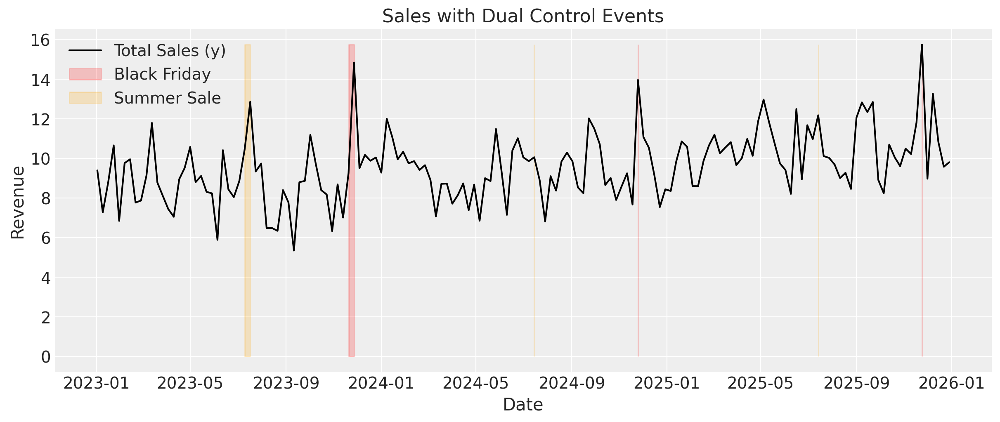

In [78]:
# 7. Visualization of Events & Sales
fig, ax = plt.subplots(figsize=(12, 5))
sns.lineplot(data=df, x="date", y="sales", color="black", label="Total Sales (y)")
plt.fill_between(df["date"], 0, df["sales"].max(), where=df["event_bf"]>0, color='red', alpha=0.2, label="Black Friday")
plt.fill_between(df["date"], 0, df["sales"].max(), where=df["event_summer"]>0, color='orange', alpha=0.2, label="Summer Sale")
ax.set(title="Sales with Dual Control Events", xlabel="Date", ylabel="Revenue")
plt.legend()
plt.show()

In [79]:
columns_to_keep = [
    "date",
    "sales",
    "channel1",
    "channel2",
    "channel3",
    "event_bf",
    "event_summer",
]

data = df[columns_to_keep].copy()

data.head()

,date,sales,channel1,channel2,channel3,event_bf,event_summer
0,2023-01-02,9.404094,0.427998,0.906082,0.702798,0.0,0.0
1,2023-01-09,7.284933,0.997578,0.000000,0.138756,0.0,0.0
2,2023-01-16,8.812880,0.928205,0.000000,0.410956,0.0,0.0
3,2023-01-23,10.664336,0.246129,0.892578,0.339114,0.0,0.0
4,2023-01-30,6.852424,0.158473,0.000000,0.181858,0.0,0.0


In [80]:
cols_to_multiply = ["sales", "channel1", "channel2", "channel3"]
data[cols_to_multiply] = data[cols_to_multiply] * 20000

In [81]:
data[["sales", "channel1", "channel2", "channel3"]] = data[["sales", "channel1", "channel2", "channel3"]].round(2)
data.head()

,date,sales,channel1,channel2,channel3,event_bf,event_summer
0,2023-01-02,188081.87,8559.95,18121.64,14055.97,0.0,0.0
1,2023-01-09,145698.65,19951.55,0.00,2775.13,0.0,0.0
2,2023-01-16,176257.60,18564.11,0.00,8219.12,0.0,0.0
3,2023-01-23,213286.73,4922.58,17851.56,6782.28,0.0,0.0
4,2023-01-30,137048.48,3169.46,0.00,3637.16,0.0,0.0


In [82]:
data.to_csv("simulated_mmm_data.csv", index=False)

In [84]:
data.head()

,date,sales,channel1,channel2,channel3,event_bf,event_summer
0,2023-01-02,188081.87,8559.95,18121.64,14055.97,0.0,0.0
1,2023-01-09,145698.65,19951.55,0.00,2775.13,0.0,0.0
2,2023-01-16,176257.60,18564.11,0.00,8219.12,0.0,0.0
3,2023-01-23,213286.73,4922.58,17851.56,6782.28,0.0,0.0
4,2023-01-30,137048.48,3169.46,0.00,3637.16,0.0,0.0


## Read the data

In [3]:
df=pd.read_csv("simulated_mmm_data.csv")

channel_columns=['channel1','channel2','channel3']
control_columns=['event_bf','event_summer']

df["date"] = pd.to_datetime(df["date"])
date_column='date'
sales_column='sales'

df.head()

,date,sales,channel1,channel2,channel3,event_bf,event_summer
0,2023-01-02,188081.87,8559.95,18121.64,14055.97,0.0,0.0
1,2023-01-09,145698.65,19951.55,0.00,2775.13,0.0,0.0
2,2023-01-16,176257.60,18564.11,0.00,8219.12,0.0,0.0
3,2023-01-23,213286.73,4922.58,17851.56,6782.28,0.0,0.0
4,2023-01-30,137048.48,3169.46,0.00,3637.16,0.0,0.0


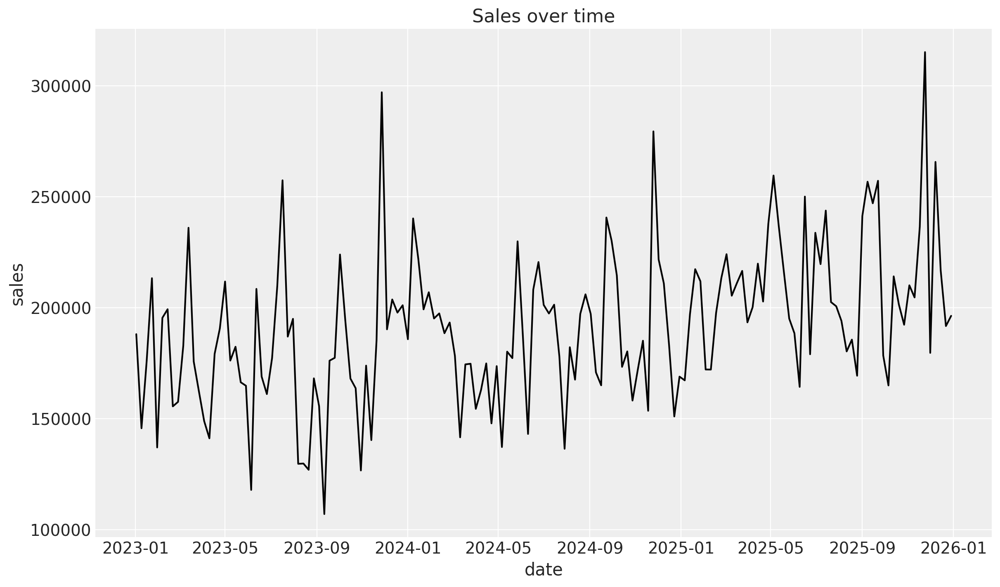

In [5]:
fig, ax = plt.subplots()
sns.lineplot(data=df, x=date_column, y=sales_column, color="black", ax=ax)
ax.set(title="Sales over time", xlabel="date", ylabel="sales");

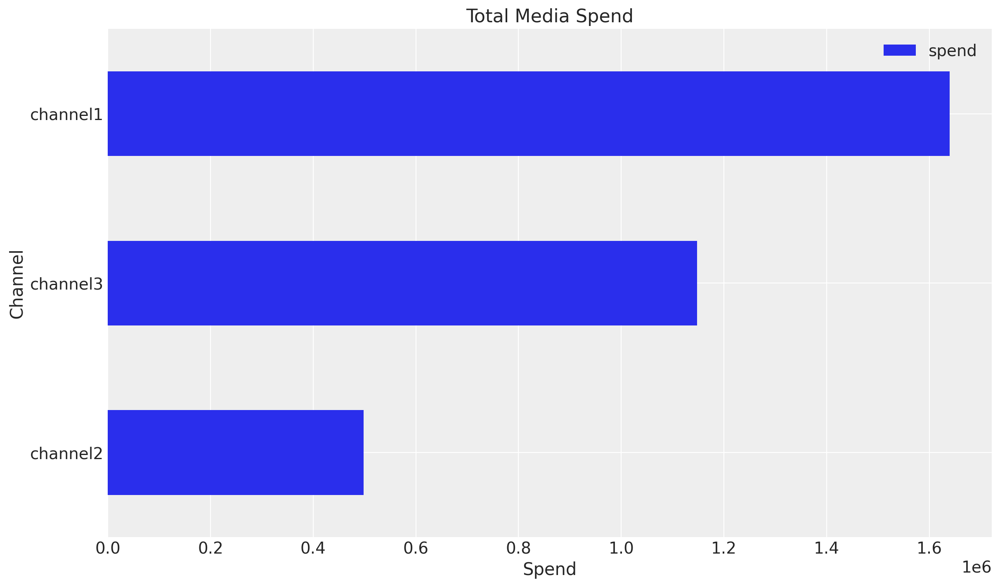

In [94]:
fig, ax = plt.subplots()
data.melt(
    value_vars=channel_columns, var_name="channel", value_name="spend"
).groupby("channel").agg({"spend": "sum"}).sort_values(by="spend").plot.barh(ax=ax)
ax.set(title="Total Media Spend", xlabel="Spend", ylabel="Channel");

Text(0.5, 0, 'date')

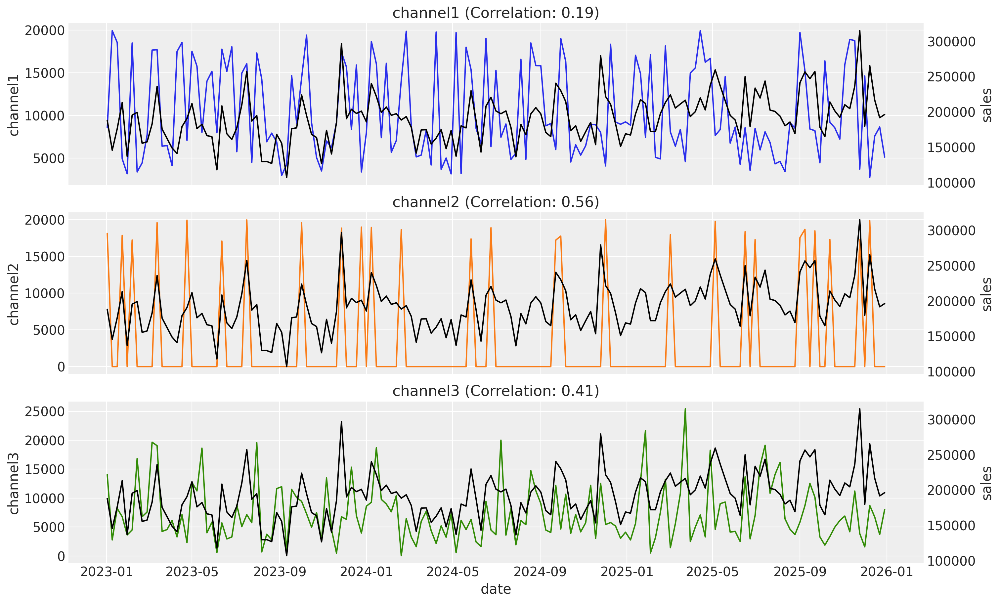

In [6]:
n_channels = len(channel_columns)
fig, axes = plt.subplots(
    nrows=n_channels,
    ncols=1,
    figsize=(15, 3 * n_channels),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, channel in enumerate(channel_columns):
    ax = axes[i]
    ax_twin = ax.twinx()
    sns.lineplot(data=df, x="date", y=channel, color=f"C{i}", ax=ax)
    sns.lineplot(data=df, x="date", y="sales", color="black", ax=ax_twin)
    correlation = df[[channel, "sales"]].corr().iloc[0, 1]
    ax_twin.grid(None)
    ax.set(title=f"{channel} (Correlation: {correlation:.2f})")
    

ax.set_xlabel("date")

## Modeling

Test set starts from date: 2025-09-22 00:00:00


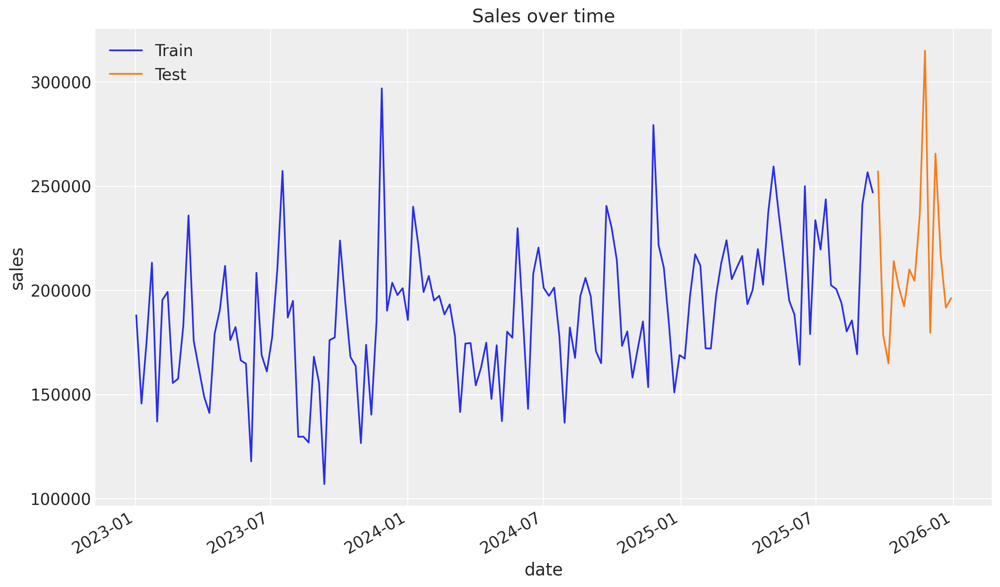

In [5]:
import matplotlib.dates as mdates

# Convert 'date' column to datetime
df["date"] = pd.to_datetime(df["date"])

# Calculate the split index for the last 10% of the dataframe
split_idx = int(len(df) * 0.9)
train_test_split_date = df.iloc[split_idx]["date"]

train_mask = df.date <= train_test_split_date
test_mask = df.date > train_test_split_date

train_df = df[train_mask]
test_df = df[test_mask]

print(f"Test set starts from date: {test_df['date'].iloc[0]}")

fig, ax = plt.subplots()
sns.lineplot(data=train_df, x="date", y="sales", color="C0", label="Train", ax=ax)
sns.lineplot(data=test_df, x="date", y="sales", color="C1", label="Test", ax=ax)

# Format x-axis for six-month intervals
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))

fig.autofmt_xdate()
ax.set(title="Sales over time", xlabel="date", ylabel="sales");

In [6]:
X_train = train_df.drop(columns="sales")
X_test = test_df.drop(columns="sales")

y_train = train_df["sales"]
y_test = test_df["sales"]

In [7]:
n_channels = len(channel_columns)
controls = ["event_bf","event_summer"]

In [18]:
total_spend_per_channel=X_train[channel_columns].sum(axis=0)

spend_share = total_spend_per_channel / total_spend_per_channel.sum()
spend_share

channel1    0.500224
channel2    0.142880
channel3    0.356896
dtype: float64

In [20]:
prior_sigma =spend_share.to_numpy()
print(prior_sigma)

[0.50022372 0.14288049 0.35689579]


In [21]:
my_model_config = {
    "intercept": Prior("HalfNormal", sigma=5),
    "saturation_beta": Prior("HalfNormal", sigma=prior_sigma,dims="channel"),
    "gamma_control": Prior("Normal", mu=0, sigma=0.05),
    "gamma_fourier": Prior("Laplace", mu=0, b=0.2),
    "likelihood": Prior("TruncatedNormal", sigma=Prior("HalfNormal", sigma=6)),
}


In [22]:
my_sampler_config = {"progressbar": True}

mmm = MMM(
    date_column="date",
    channel_columns=channel_columns,
    control_columns=control_columns,
    adstock=GeometricAdstock(l_max=10),
    saturation=LogisticSaturation(),
    time_varying_intercept=False,
    yearly_seasonality=2,
    model_config=my_model_config,
    sampler_config=my_sampler_config,
)

In [19]:
mmm.model_config

{'intercept': Prior("HalfNormal", sigma=5),
 'likelihood': Prior("TruncatedNormal", sigma=Prior("HalfNormal", sigma=6)),
 'gamma_control': Prior("Normal", mu=0, sigma=0.05),
 'gamma_fourier': Prior("Laplace", mu=0, b=0.2),
 'adstock_alpha': Prior("Beta", alpha=1, beta=3, dims="channel"),
 'saturation_lam': Prior("Gamma", alpha=3, beta=1, dims="channel"),
 'saturation_beta': Prior("HalfNormal", sigma=[0.50022372 0.14288049 0.35689579], dims="channel")}

## Prior predictive checks

Sampling: [adstock_alpha, gamma_control, gamma_fourier, intercept, saturation_beta, saturation_lam, y, y_sigma]


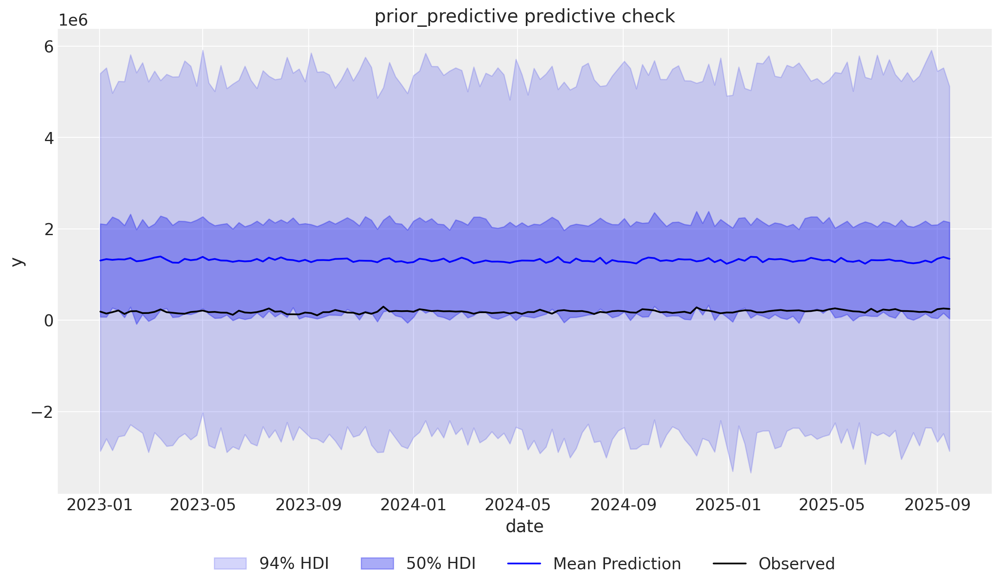

In [20]:
# Generate prior predictive samples
mmm.sample_prior_predictive(X_train, y_train, samples=4_000)
fig, ax = plt.subplots()
fig = mmm.plot_prior_predictive(original_scale=True, ax=ax)
ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.2), ncol=4)
ax.set(xlabel="date", ylabel="y");

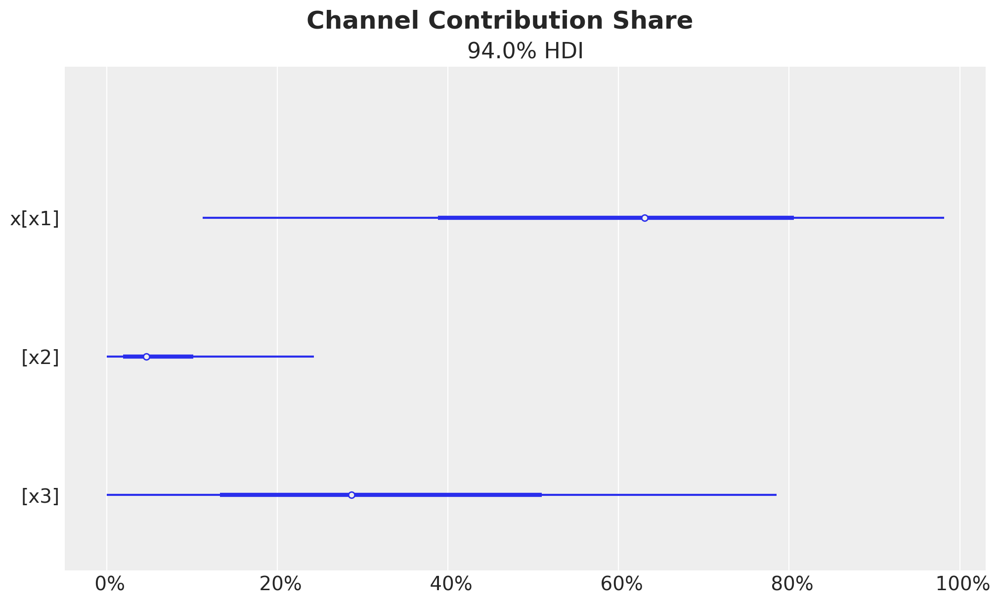

In [ ]:
fig = mmm.plot_channel_contribution_share_hdi(prior=True, figsize=(10, 6))
fig.suptitle("Channel Contribution Share", fontsize=18, fontweight="bold");

In [23]:

print("Starting MCMC sampling...")

# Define rng for reproducibility
rng = np.random.default_rng(123)

mmm.fit(
    X=X_train,
    y=y_train,
    chains=4,
    target_accept=0.975,
    random_seed=rng,
)

print("MCMC sampling complete.")


Starting MCMC sampling...


Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept, adstock_alpha, saturation_lam, saturation_beta, gamma_control, gamma_fourier, y_sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 208 seconds.


Output()

MCMC sampling complete.


In [24]:
mmm.idata.sample_stats.diverging.sum("draw")


<xarray.DataArray 'diverging' (chain: 4)> Size: 32B
array([0, 0, 0, 0])
Coordinates:
  * chain    (chain) int64 32B 0 1 2 3

In [21]:
mmm.idata

Inference data with groups:
	> posterior
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data
	> fit_data

In [22]:
az.summary(
    data=mmm.idata,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
)["r_hat"].describe()

[autoreload of cutils_ext failed: Traceback (most recent call last):
  File "/Users/Office/Desktop/Projects/MMM library/mmm-library/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 273, in check
    superreload(m, reload, self.old_objects)
  File "/Users/Office/Desktop/Projects/MMM library/mmm-library/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 471, in superreload
    module = reload(module)
             ^^^^^^^^^^^^^^
  File "/opt/anaconda3/lib/python3.12/importlib/__init__.py", line 130, in reload
    raise ModuleNotFoundError(f"spec not found for the module {name!r}", name=name)
ModuleNotFoundError: spec not found for the module 'cutils_ext'
]


count    17.0
mean      1.0
std       0.0
min       1.0
25%       1.0
50%       1.0
75%       1.0
max       1.0
Name: r_hat, dtype: float64

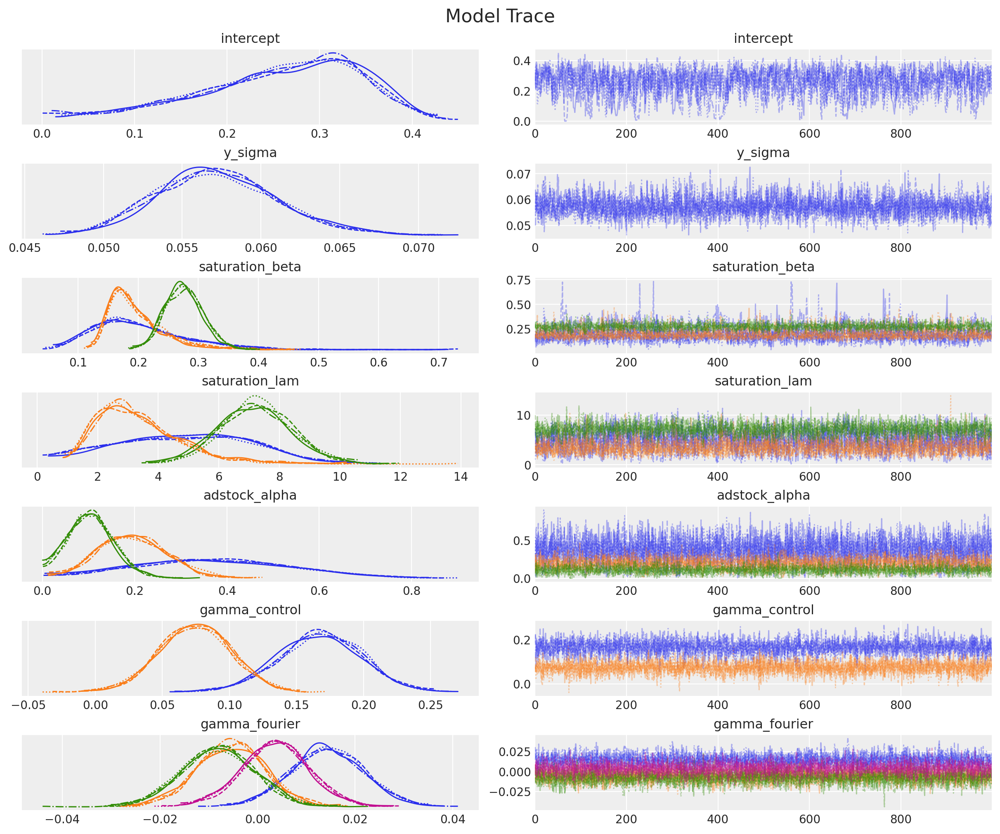

In [23]:
_ = az.plot_trace(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
    compact=True,
    backend_kwargs={"figsize": (12, 10), "layout": "constrained"},
)
plt.gcf().suptitle("Model Trace", fontsize=16);

## Posterior Predictive Check

In [25]:
mmm.sample_posterior_predictive(X_train, extend_idata=True, combined=True)

Sampling: [y]


Output()

<xarray.Dataset> Size: 5MB
Dimensions:  (date: 142, sample: 4000)
Coordinates:
  * date     (date) datetime64[ns] 1kB 2023-01-02 2023-01-09 ... 2025-09-15
  * sample   (sample) object 32kB MultiIndex
  * chain    (sample) int64 32kB 0 0 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3 3 3 3
  * draw     (sample) int64 32kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
Data variables:
    y        (date, sample) float64 5MB 1.699e+05 2.237e+05 ... 2.071e+05
Attributes:
    created_at:                 2026-03-20T14:17:38.681333+00:00
    arviz_version:              0.21.0
    inference_library:          pymc
    inference_library_version:  5.28.1

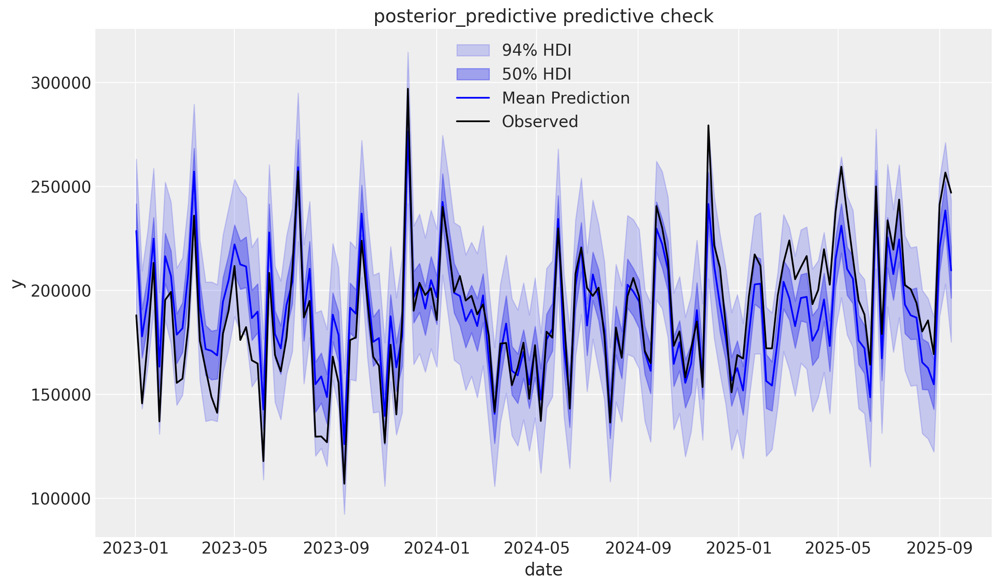

In [25]:
mmm.plot_posterior_predictive(original_scale=True);

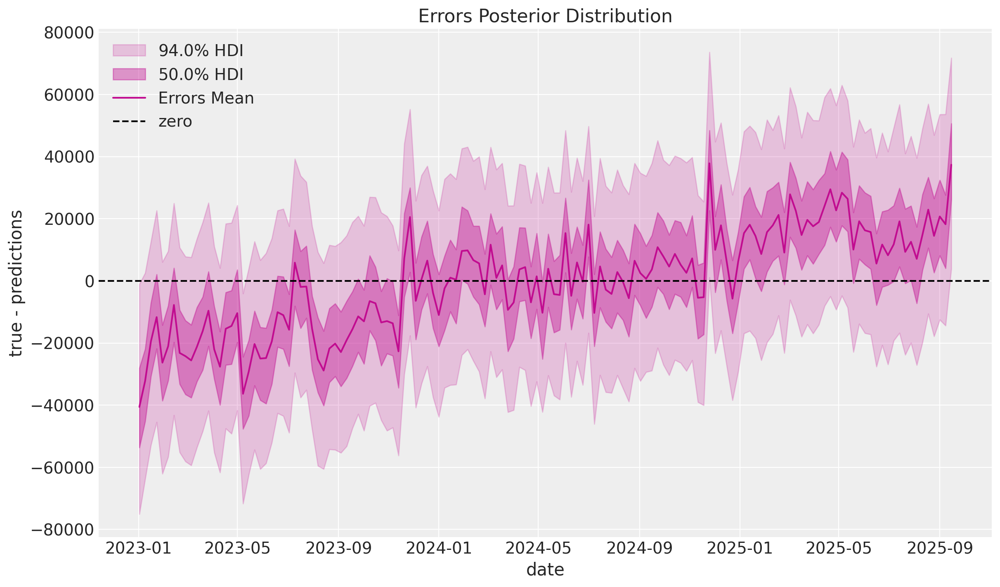

In [26]:
mmm.plot_errors(original_scale=True);

## Media deep dive

### Channel Contributions

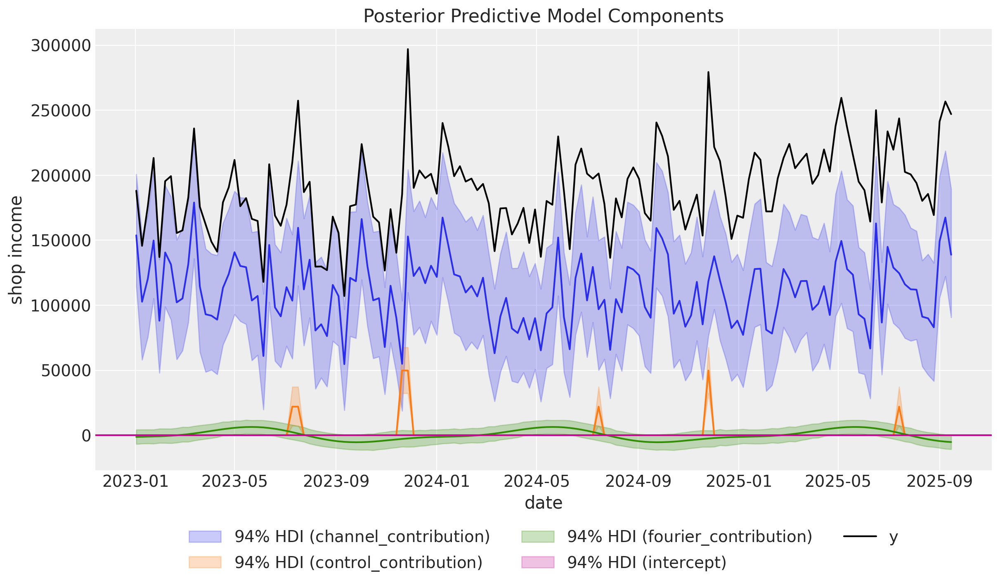

In [27]:
fig = mmm.plot_components_contributions(original_scale=True)
fig.gca().set(xlabel="date", ylabel="shop income");

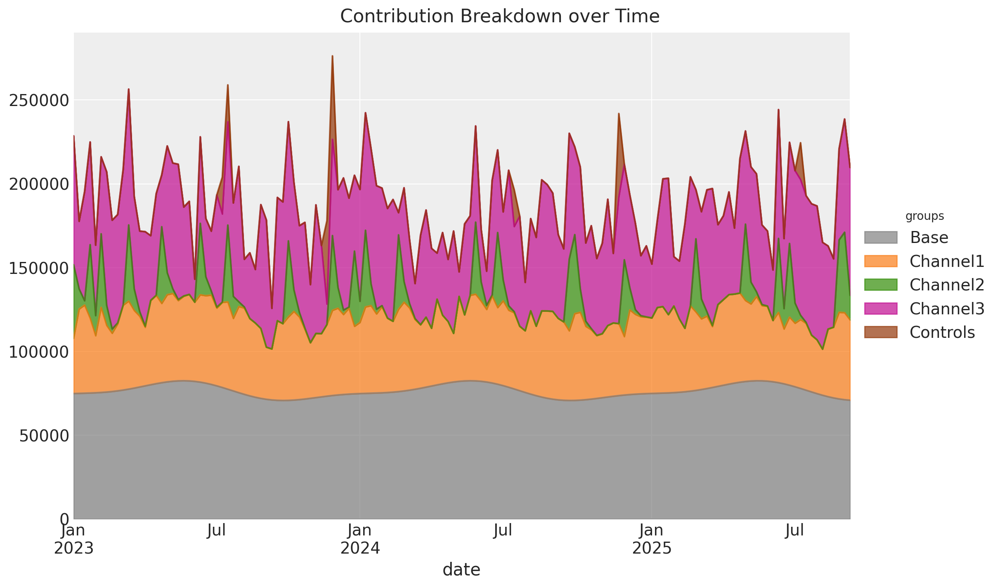

In [30]:
groups = {
    "Base": [
        "intercept",
        "yearly_seasonality",
    ],
    "Channel1": ["channel1"],  
    "Channel2": ["channel2"], 
    "Channel3": ["channel3"],  
    "Controls": control_columns,
}

area_kwargs = {
    "color": {
        "Channel1": "royalblue",
        "Channel2": "crimson",
        "Channel3": "goldenrod",
        "Base": "gray",
        "Controls": "slateblue",
    },
    "alpha": 0.6,
}

fig = mmm.plot_grouped_contribution_breakdown_over_time(
    stack_groups=groups,
    original_scale=True,
    area_kwargs={
        "color": {
            "Channel1": "C1",
            "Channel2": "C2",
            "Channel3": "C3",
            "Base": "gray",
            "Controls": "C4",
        },
        "alpha": 0.7,
    },
)

fig.suptitle("Contribution Breakdown over Time", fontsize=16);

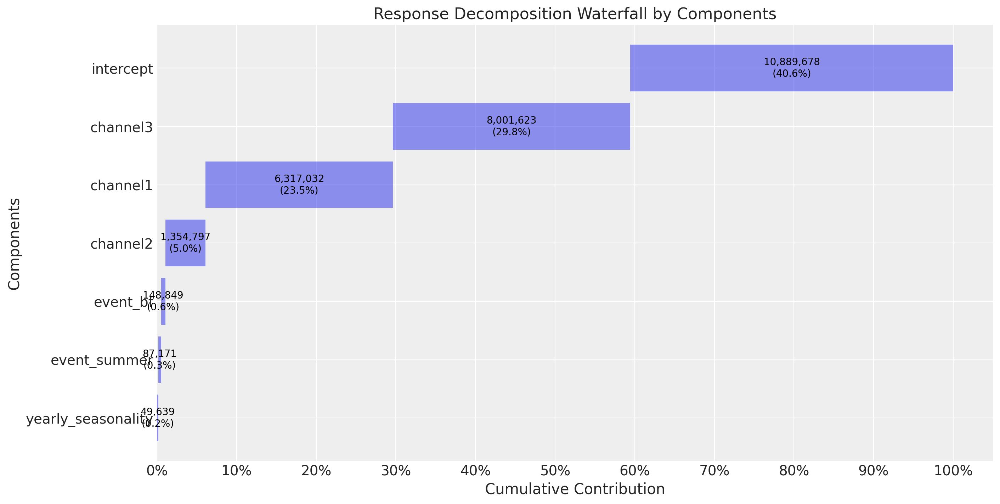

In [26]:
mmm.plot_waterfall_components_decomposition();

### Saturation curves

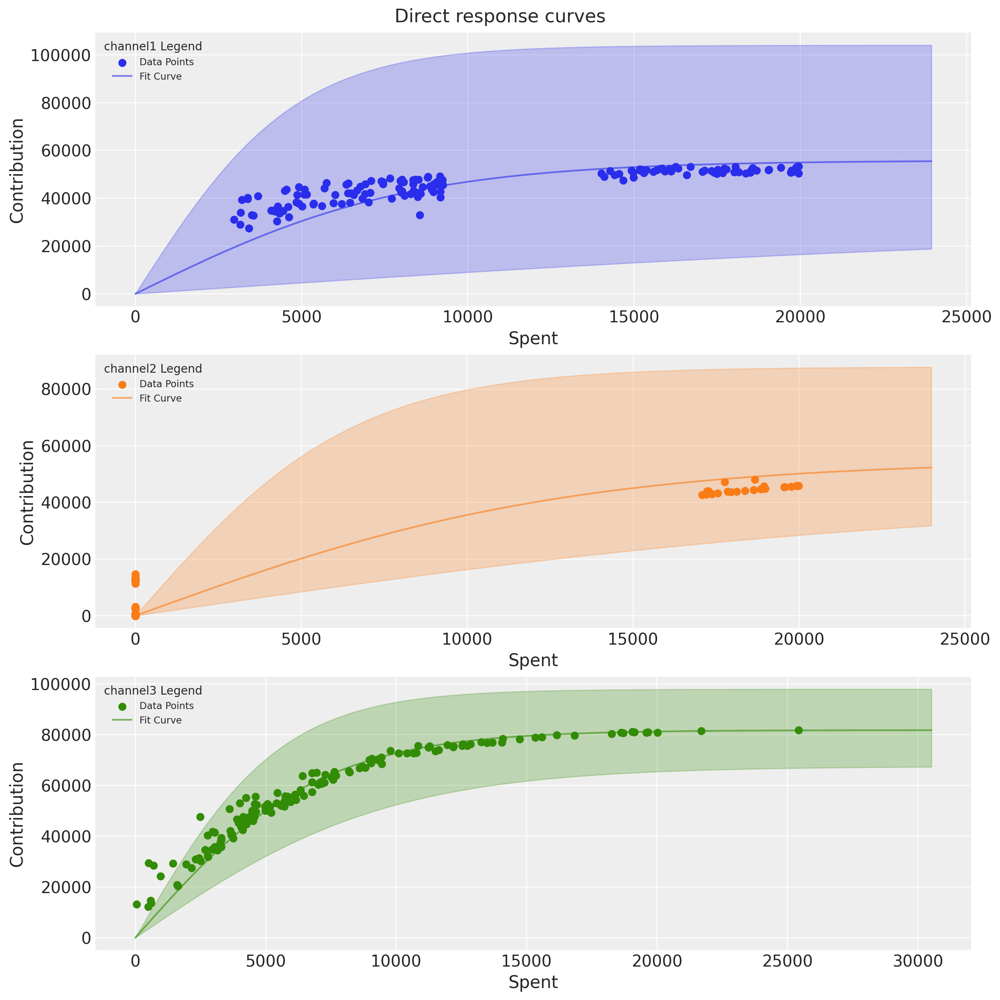

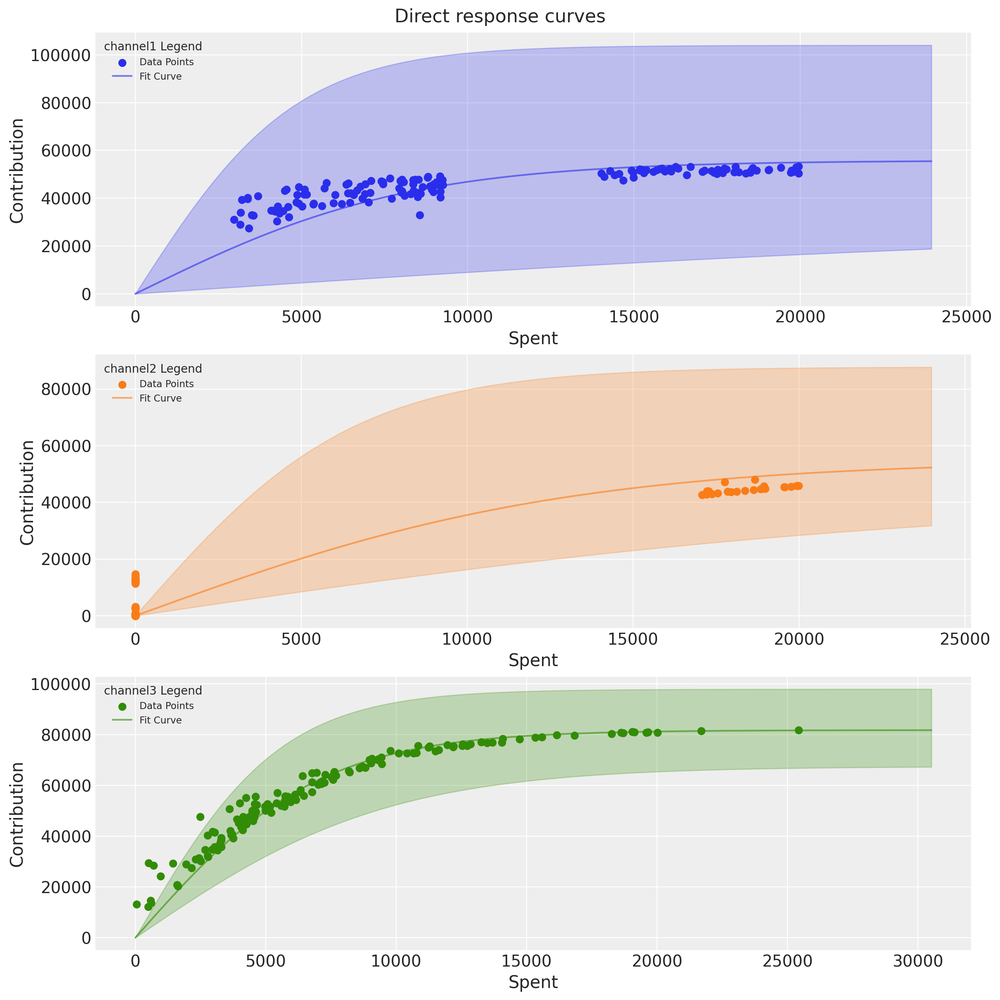

In [32]:
mmm.plot_direct_contribution_curves(
	show_fit=True,
	xlim_max=1.2,  # xlim_max should be int, not float
)

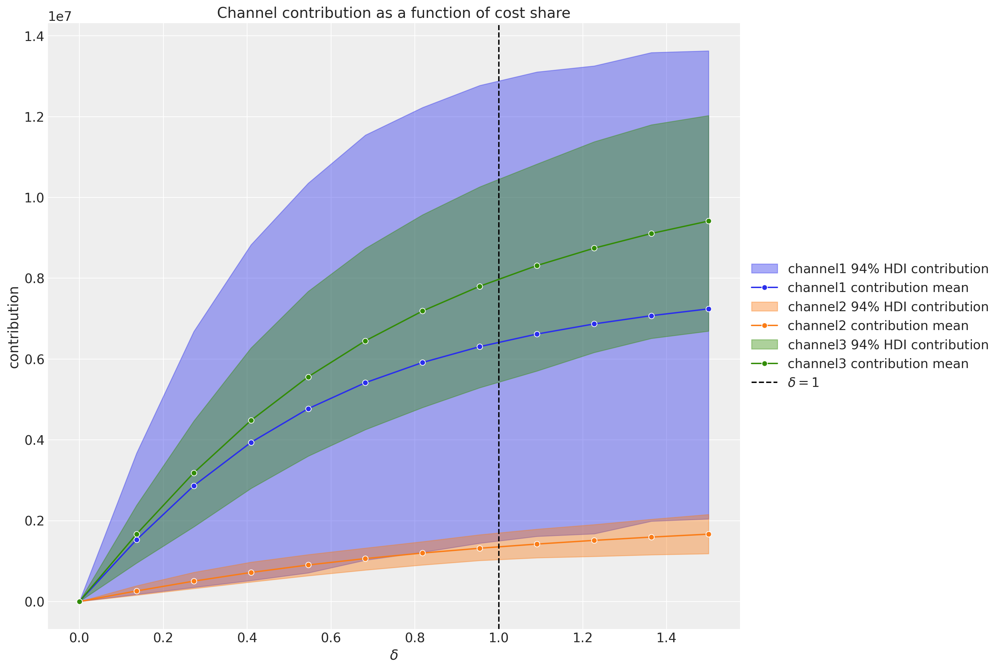

In [34]:
mmm.plot_channel_contribution_grid(start=0, stop=1.5, num=12, figsize=(15, 10));


### ROAS

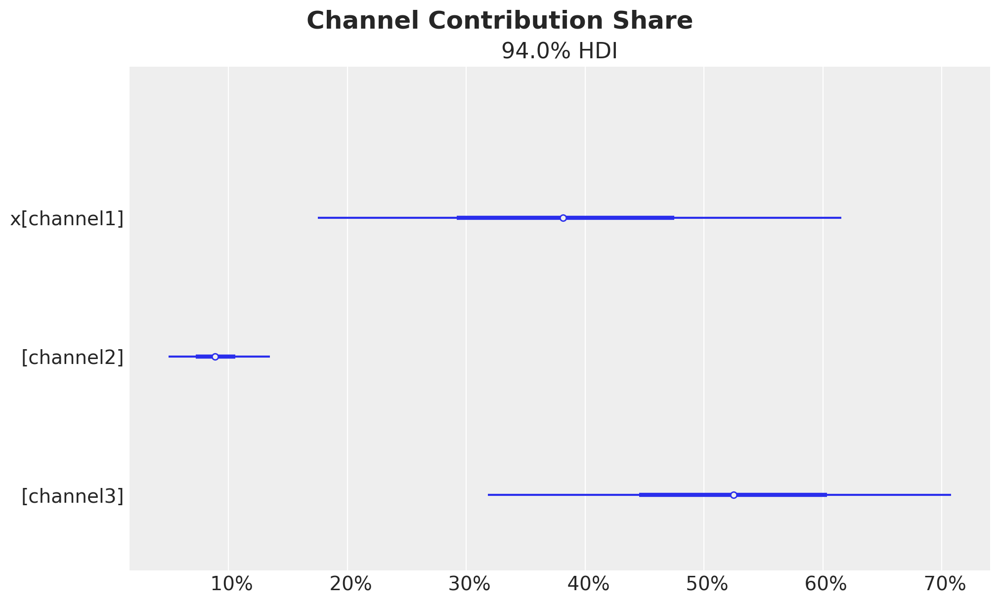

In [37]:
fig = mmm.plot_channel_contribution_share_hdi(figsize=(10, 6))
fig.suptitle("Channel Contribution Share", fontsize=18, fontweight="bold");

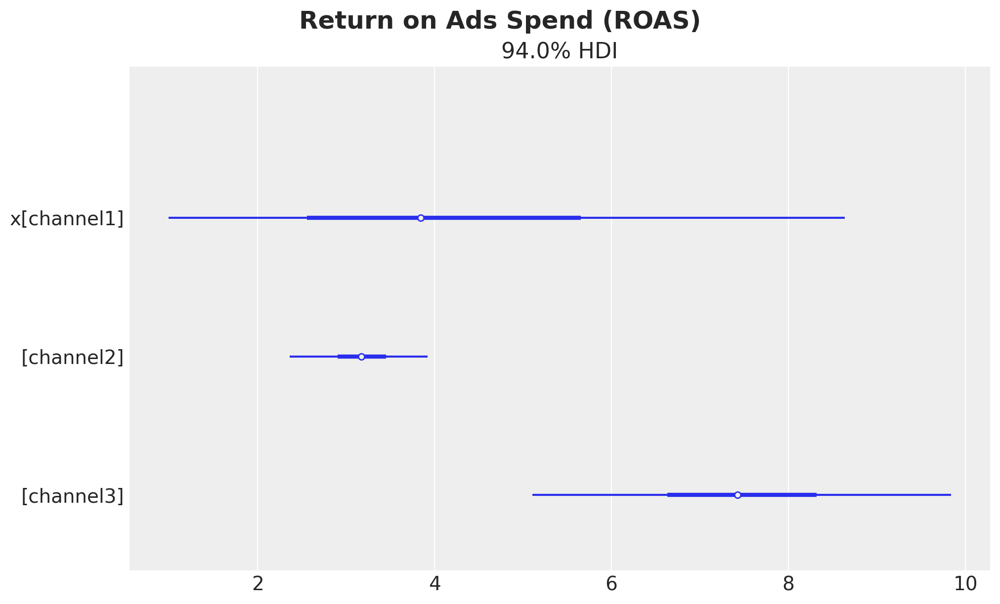

In [39]:
# Get the channel contributions on the original scale
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()

# Sum the contributions over the whole training period
spend_sum = X_train[channel_columns].sum().to_numpy()
spend_sum = spend_sum[
    np.newaxis, np.newaxis, :
]  # We need these extra dimensions to broadcast the spend sum to the shape of the contributions.

# Compute the ROAS as the ratio of the mean contribution and the spend for each channel
roas_samples = channel_contribution_original_scale.sum(dim="date") / spend_sum

# Plot the ROAS
fig, ax = plt.subplots(figsize=(10, 6))
az.plot_forest(roas_samples, combined=True, ax=ax)
fig.suptitle("Return on Ads Spend (ROAS)", fontsize=18, fontweight="bold");

/var/folders/kl/t3xjjp5d4vnftjl0d8g0jmb00000gp/T/ipykernel_17575/3660758946.py:22: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


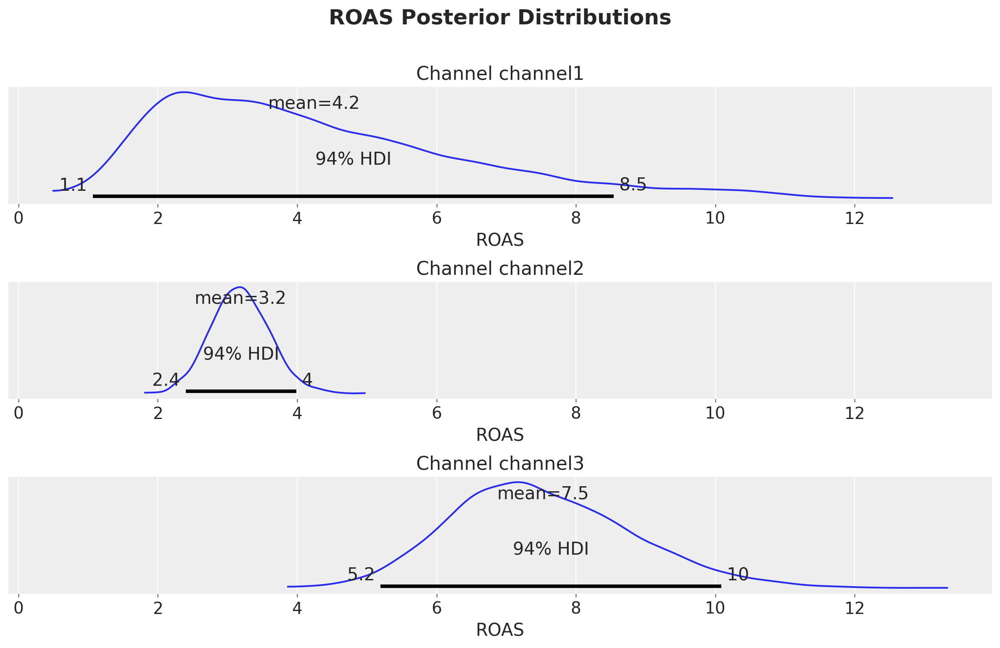

In [27]:
# Compute channel contribution in original scale
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()

# Calculate total spend per channel for the geo present in your data
spend_sum = X_train[channel_columns].sum().to_numpy()

# Calculate ROAS samples: sum contributions over dates, divide by total spend per channel
roas_samples = (
    channel_contribution_original_scale.sum(dim="date")
    / spend_sum
)

fig, axes = plt.subplots(
    nrows=len(channel_columns), ncols=1, figsize=(12, 2.5 * len(channel_columns)), sharex=True, layout="constrained"
)

for i, channel in enumerate(channel_columns):
    az.plot_posterior(roas_samples.sel(channel=channel), ax=axes[i])
    axes[i].set(title=f"Channel {channel}", xlabel="ROAS")

fig.suptitle("ROAS Posterior Distributions", fontsize=18, fontweight="bold", y=1.02)
plt.tight_layout()
plt.show()

In [41]:
# Calculate ROAS mean for each channel using roas_samples
roas_means = {channel: roas_samples.sel(channel=channel).mean().item() for channel in channel_columns}
print(roas_means)

{'channel1': 4.309526748880575, 'channel2': 3.1831503438218314, 'channel3': 7.5119158378965345}


/var/folders/kl/t3xjjp5d4vnftjl0d8g0jmb00000gp/T/ipykernel_4749/2635833960.py:50: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


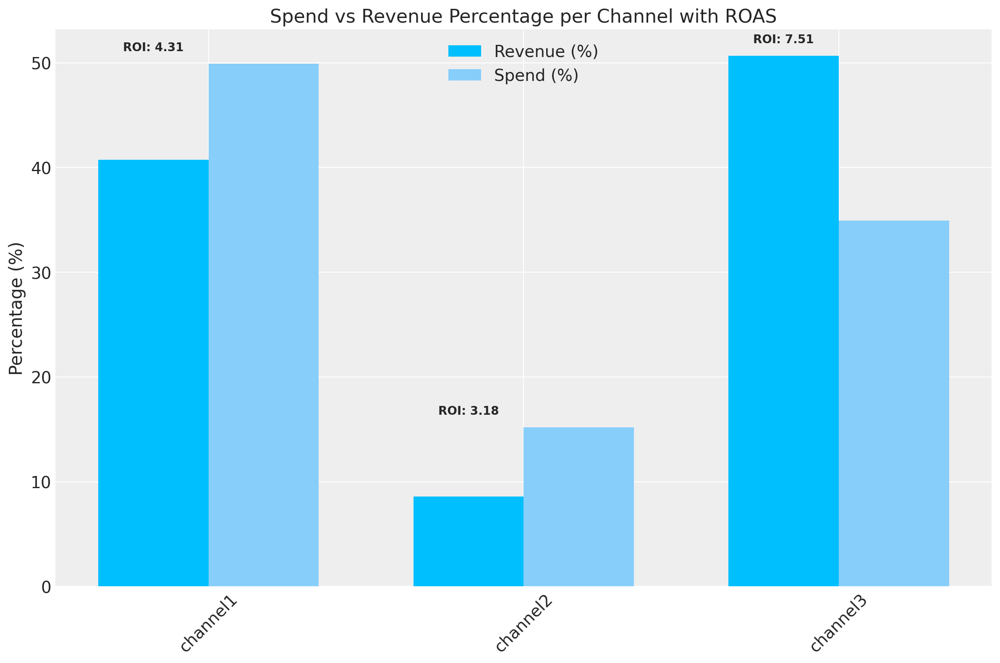

In [43]:
import numpy as np
import matplotlib.pyplot as plt


# Get spends and contributions for each channel for the selected geo in the specified order
spends = [df[channel].sum() for channel in channel_columns]
contributions = [
    mmm.idata["posterior"]["channel_contribution_original_scale"]
    .sel(channel=channel)
    .mean(dim=["chain", "draw"])
    .sum()
    .item()
    for channel in channel_columns
]

# Calculate percentages
total_spend = np.sum(spends)
total_contribution = np.sum(contributions)
spend_percent = [s / total_spend * 100 if total_spend > 0 else 0 for s in spends]
contribution_percent = [c / total_contribution * 100 if total_contribution > 0 else 0 for c in contributions]
# Compute mean ROAS for each channel
roas_means = {channel: roas_samples.sel(channel=channel).mean().item() for channel in channel_columns}
roas_vals = [roas_means[channel] for channel in channel_columns]

x = np.arange(len(channel_columns))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 8))
bars1 = ax.bar(x - width/2, contribution_percent, width, label='Revenue (%)', color='deepskyblue')
bars2 = ax.bar(x + width/2, spend_percent, width, label='Spend (%)', color='lightskyblue')

# Annotate ROAS on top of each channel
for i, (bar1, bar2, roas_val) in enumerate(zip(bars1, bars2, roas_vals)):
    max_height = max(bar1.get_height(), bar2.get_height())
    ax.text(
        bar1.get_x() + bar1.get_width()/2,
        max_height + 1,
        f'ROI: {roas_val:.2f}',
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold'
    )

ax.set_xticks(x)
ax.set_xticklabels(channel_columns, rotation=45)
ax.set_ylabel('Percentage (%)')
ax.set_title(f'Spend vs Revenue Percentage per Channel with ROAS')
ax.legend()
plt.tight_layout()
plt.show()

In [115]:
roas_vals

[4.309526748880575, 3.1831503438218314, 7.5119158378965345]

/var/folders/kl/t3xjjp5d4vnftjl0d8g0jmb00000gp/T/ipykernel_4749/2390185749.py:36: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


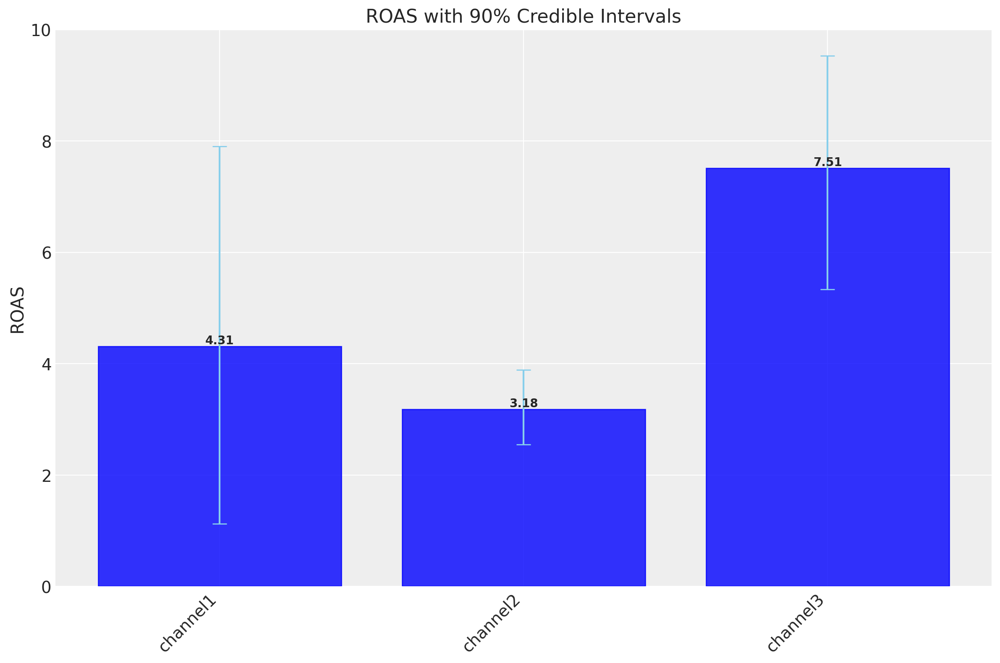

In [ ]:
# roas_vals is a list of mean ROAS values for each channel in channel_columns order
roas_vals = [roas_samples.sel(channel=ch).mean().item() for ch in channel_columns]



# Reorder ROAS means and HDIs according to channels
roas_hdi = np.array([az.hdi(roas_samples.sel(channel=ch), hdi_prob=0.90)["x"].to_numpy() for ch in channel_columns])

# Use roas_vals (list of means in channel_columns order)
roas_means_arr = np.array(roas_vals)
yerr_lower = np.maximum(roas_means_arr - roas_hdi[:, 0], 0)
yerr_upper = np.maximum(roas_hdi[:, 1] - roas_means_arr, 0)
yerr = np.vstack([yerr_lower, yerr_upper])

x_pos = np.arange(len(channel_columns))
fig, ax = plt.subplots(figsize=(12,8 ))
bars = ax.bar(x_pos, roas_means_arr, yerr=yerr,
              capsize=6, color="blue", edgecolor="blue", alpha=0.8, ecolor="skyblue")

# Annotate ROAS mean on top of each bar
for i, bar in enumerate(bars):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f"{roas_means_arr[i]:.2f}",
        ha="center",
        va="bottom",
        fontsize=10,
        fontweight="bold"
    )

ax.set_xticks(x_pos)
ax.set_xticklabels(channel_columns, rotation=45, ha="right")
ax.set_ylabel("ROAS")
ax.set_title("ROAS with 90% Credible Intervals")
plt.tight_layout()
plt.show()


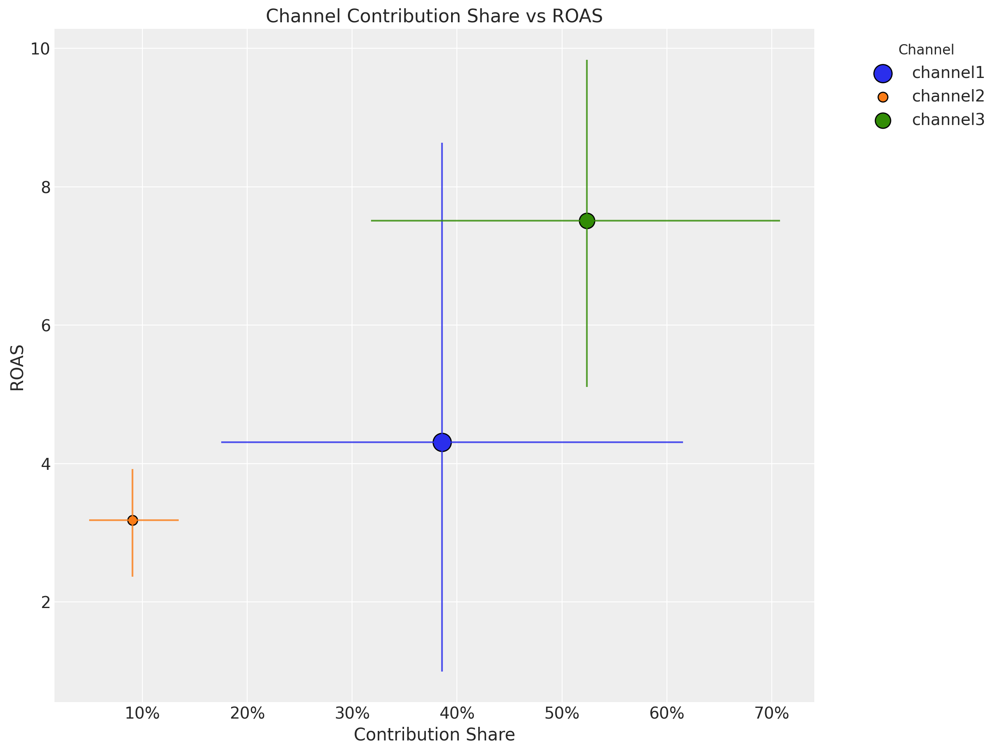

In [83]:
# Get the contribution share samples
share_samples = mmm.get_channel_contribution_share_samples()

fig, ax = plt.subplots(figsize=(12, 9))

for i, channel in enumerate(channel_columns):
    # Contribution share mean and hdi
    share_mean = share_samples.sel(channel=channel).mean().to_numpy()
    share_hdi = az.hdi(share_samples.sel(channel=channel))["x"].to_numpy()

    # ROAS mean and hdi
    roas_mean = roas_samples.sel(channel=channel).mean().to_numpy()
    roas_hdi = az.hdi(roas_samples.sel(channel=channel))["x"].to_numpy()

    # Plot the contribution share hdi
    ax.vlines(share_mean, roas_hdi[0], roas_hdi[1], color=f"C{i}", alpha=0.8)

    # Plot the ROAS hdi
    ax.hlines(roas_mean, share_hdi[0], share_hdi[1], color=f"C{i}", alpha=0.8)

    # Plot the means
    ax.scatter(
        share_mean,
        roas_mean,
        # Size of the scatter points is proportional to the spend share
        s=5 * (spend_share[i] * 100),
        color=f"C{i}",
        edgecolor="black",
        label=channel,
    )
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))

ax.legend(
    bbox_to_anchor=(1.05, 1), loc="upper left", title="Channel", title_fontsize=12
)
ax.set(
    title="Channel Contribution Share vs ROAS",
    xlabel="Contribution Share",
    ylabel="ROAS",
);

### Out of sample predictions

In [46]:
rng = np.random.default_rng(seed=42)
y_pred_test = mmm.sample_posterior_predictive(
    X_test,
    include_last_observations=True,
    original_scale=True,
    var_names=["y", "channel_contribution"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

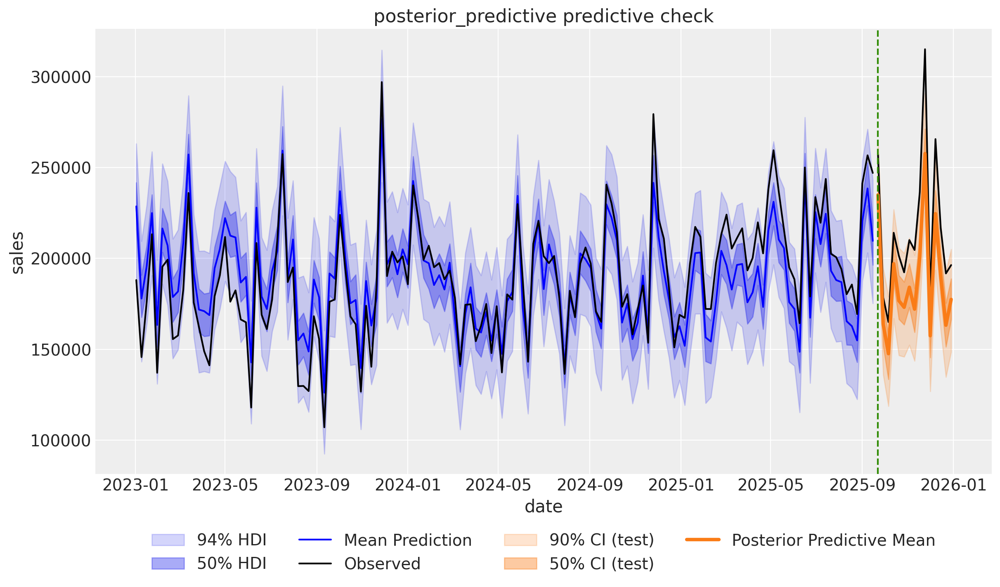

In [49]:
fig, ax = plt.subplots()
mmm.plot_posterior_predictive(original_scale=True, ax=ax)

test_hdi_90 = az.hdi(y_pred_test["y"].to_numpy().T, hdi_prob=0.90)
test_hdi_50 = az.hdi(y_pred_test["y"].to_numpy().T, hdi_prob=0.50)

ax.fill_between(
    X_test["date"],
    test_hdi_90[:, 0],
    test_hdi_90[:, 1],
    color="C1",
    label=f"{0.90:.0%} CI (test)",
    alpha=0.2,
)

ax.fill_between(
    X_test["date"],
    test_hdi_50[:, 0],
    test_hdi_50[:, 1],
    color="C1",
    label=f"{0.50:.0%} CI (test)",
    alpha=0.4,
)

ax.plot(X_test["date"], y_test, color="black")
ax.plot(
    X_test["date"],
    y_pred_test["y"].mean(dim="sample"),
    color="C1",
    linewidth=3,
    label="Posterior Predictive Mean",
)
ax.axvline(X_test["date"].iloc[0], color="C2", linestyle="--")
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(ylabel="sales");

(array([20362., 20376., 20393., 20407., 20423., 20437., 20454.]),
 [Text(20362.0, 0, '2025-10-01'),
  Text(20376.0, 0, '2025-10-15'),
  Text(20393.0, 0, '2025-11-01'),
  Text(20407.0, 0, '2025-11-15'),
  Text(20423.0, 0, '2025-12-01'),
  Text(20437.0, 0, '2025-12-15'),
  Text(20454.0, 0, '2026-01-01')])

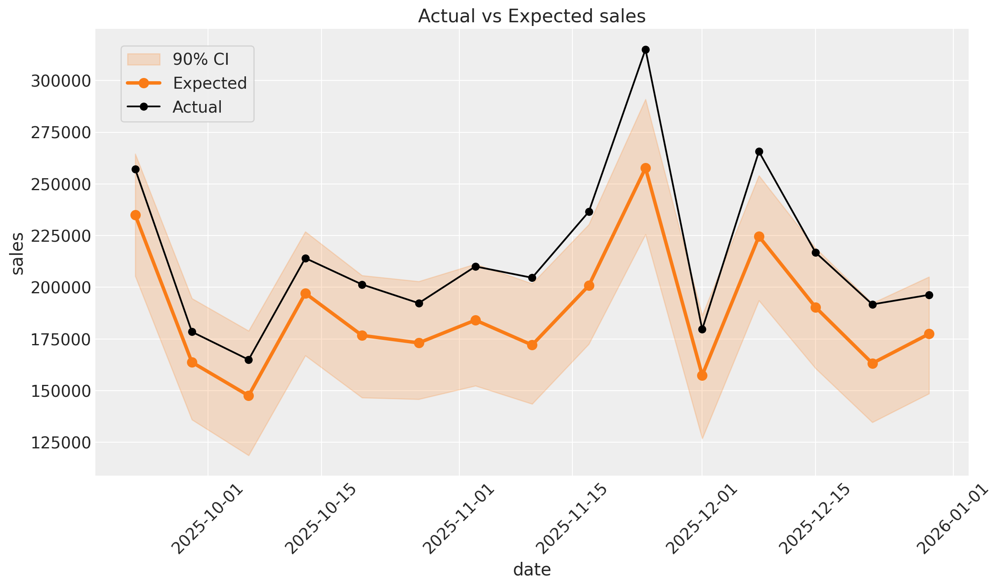

In [51]:
fig, ax = plt.subplots()
ax.fill_between(
    X_test["date"],
    test_hdi_90[:, 0],
    test_hdi_90[:, 1],
    color="C1",
    label=f"{0.90:.0%} CI",
    alpha=0.2,
)
ax.plot(
    X_test["date"],
    y_pred_test["y"].mean(dim="sample"),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Expected",
)
ax.plot(X_test["date"], y_test, marker="o", color="black", label="Actual")

# Move legend to left inside the plot
ax.legend(loc="upper left", bbox_to_anchor=(0.02, 0.98), ncol=1, frameon=True)
ax.set(title="Actual vs Expected sales", xlabel="date", ylabel="sales")
plt.xticks(rotation=45)


In [117]:
from sklearn.metrics import r2_score

def mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    mask = y_true != 0
    y_true = y_true[mask]
    y_pred = y_pred[mask]
    if len(y_true) == 0:
        return np.nan
    return np.mean(np.abs((y_true - y_pred) / y_true))

# Get mean predictions for test set
y_pred_test_mean = y_pred_test["y"].mean(dim="sample").to_numpy()

# Calculate MAPE and R2
mape_test = mape(y_test, y_pred_test_mean)
r2_test = r2_score(y_test, y_pred_test_mean)

print("MAPE (test):", mape_test)
print("R2 (test):", r2_test)

MAPE (test): 0.1224811664814316
R2 (test): 0.41627381835236243


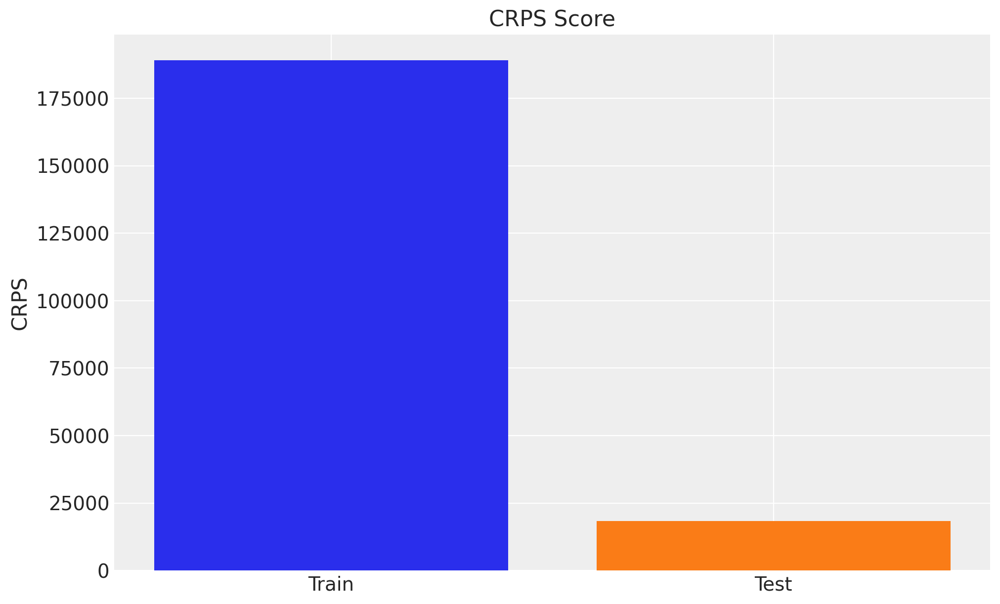

In [49]:
from pymc_marketing.metrics import crps

crps_train = crps(
    y_true=y_train.to_numpy(),
    y_pred=az.extract(mmm.idata["posterior_predictive"], var_names=["y"]).T,
)

crps_test = crps(y_true=y_test.to_numpy(), y_pred=y_pred_test["y"].T)

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(["Train", "Test"], [crps_train, crps_test], color=["C0", "C1"])
ax.set(ylabel="CRPS", title="CRPS Score");

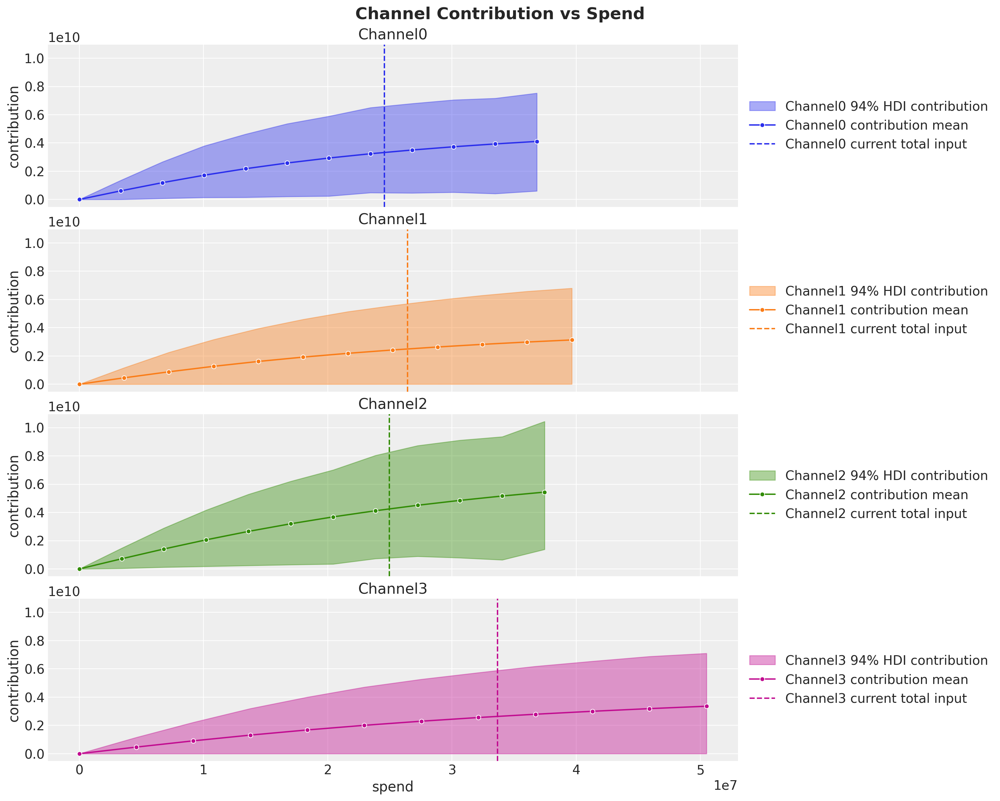

In [41]:
contributions = mmm.get_channel_contribution_forward_pass_grid(
    start=0, stop=1.5, num=12
)
share_grid = np.linspace(start=0, stop=1.5, num=12)
channel_columns = mmm.channel_columns
fig, axes = plt.subplots(
    nrows=len(channel_columns),
    ncols=1,
    figsize=(15, 3 * len(channel_columns)),
    sharex=True,
    sharey=True,
)

for i, channel in enumerate(channel_columns):
    ax = axes[i]

    channel_contribution_total = contributions.sel(channel=channel).sum(dim="date")

    hdi_prob = 0.94

    hdi_contribution = az.hdi(ary=channel_contribution_total, hdi_prob=hdi_prob).x

    total_channel_input = X_train[channel].sum()
    x_range = total_channel_input * share_grid

    ax.fill_between(
        x=x_range,
        y1=hdi_contribution[:, 0],
        y2=hdi_contribution[:, 1],
        color=f"C{i}",
        label=f"{channel} {hdi_prob:.0%} HDI contribution",
        alpha=0.4,
    )

    sns.lineplot(
        x=x_range,
        y=channel_contribution_total.mean(dim=("chain", "draw")),
        color=f"C{i}",
        marker="o",
        markersize=5,
        label=f"{channel} contribution mean",
        ax=ax,
    )

    ax.axvline(
        x=total_channel_input,
        color=f"C{i}",
        linestyle="--",
        label=f"{channel} current total input",
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=channel, xlabel="spend", ylabel="contribution")

fig.suptitle("Channel Contribution vs Spend", fontsize=18, fontweight="bold");

## Budget Optimization

In [29]:
X_test[channel_columns].sum(axis=0)

channel1    150216.08
channel2     72902.43
channel3     84802.32
dtype: float64

In [30]:
X_test[channel_columns].sum().sum()

np.float64(307920.82999999996)

In [8]:
num_periods = X_test.shape[0]

# Total budget for the test set per channel
all_budget_per_channel = X_test[channel_columns].sum()

# Total budget for the test set
all_budget = all_budget_per_channel.sum()

# Weekly budget for each channel
# We are assuming we do not know the total budget allocation in advance
# so this would be the naive "uniform" allocation.
weekly_budget = all_budget / num_periods

In [9]:
percentage_change = 0.5

mean_spend_per_period_test = X_test[channel_columns].mean()

budget_bounds = {
    key: [(1 - percentage_change) * value, (1 + percentage_change) * value]
    for key, value in (mean_spend_per_period_test).to_dict().items()
}

In [121]:
print(budget_bounds)

{'Google-PMax': [58520.7238, 175562.1714], 'Google-Demand-Gen': [18676.523189999996, 56029.56956999999], 'YouTube': [3794.62652, 11383.87956], 'Meta-ASC': [2830.7483333333334, 8492.245], 'Meta-Reach': [6696.281, 20088.843], 'Meta-Performance': [2759.269666666666, 8277.808999999997], 'TV': [6356.033666666667, 19068.101000000002], 'Microsoft': [2276.4286666666667, 6829.286], 'Pinterest': [2695.1053333333334, 8085.316000000001]}


In [10]:
import pytensor.tensor as pt
from pymc_marketing.mmm.utility import _check_samples_dimensionality

def average_response(
    samples: pt.TensorVariable, budgets: pt.TensorVariable
) -> pt.TensorVariable:
    """Compute the average response of the posterior predictive distribution."""
    return pt.mean(_check_samples_dimensionality(samples)) * 1e5 # Random multiplier to increase response, avoid the derivative to be so small.


allocation, result = mmm.optimize_budget(
    budget=weekly_budget,
    budget_bounds=budget_bounds,
    num_periods=num_periods,
    utility_function=average_response,
)


/var/folders/kl/t3xjjp5d4vnftjl0d8g0jmb00000gp/T/ipykernel_950/2444122597.py:11: DeprecationWarning: This method is deprecated and will be removed in a future version. Please migrate to the `Multidimensal.MMM` class.
  allocation, result = mmm.optimize_budget(
/Users/Office/Desktop/Projects/MMM library/mmm-library/.venv/lib/python3.12/site-packages/pymc_marketing/mmm/budget_optimizer.py:745: UserWarning: Using default equality constraint
  self.set_constraints(


In [34]:
result

 message: Optimization terminated successfully
 success: True
  status: 0
     fun: -40.96901557535953
       x: [ 9.618e+03  2.430e+03  8.480e+03]
     nit: 23
     jac: [-1.905e-03 -1.166e-03 -2.337e-03]
    nfev: 23
    njev: 23

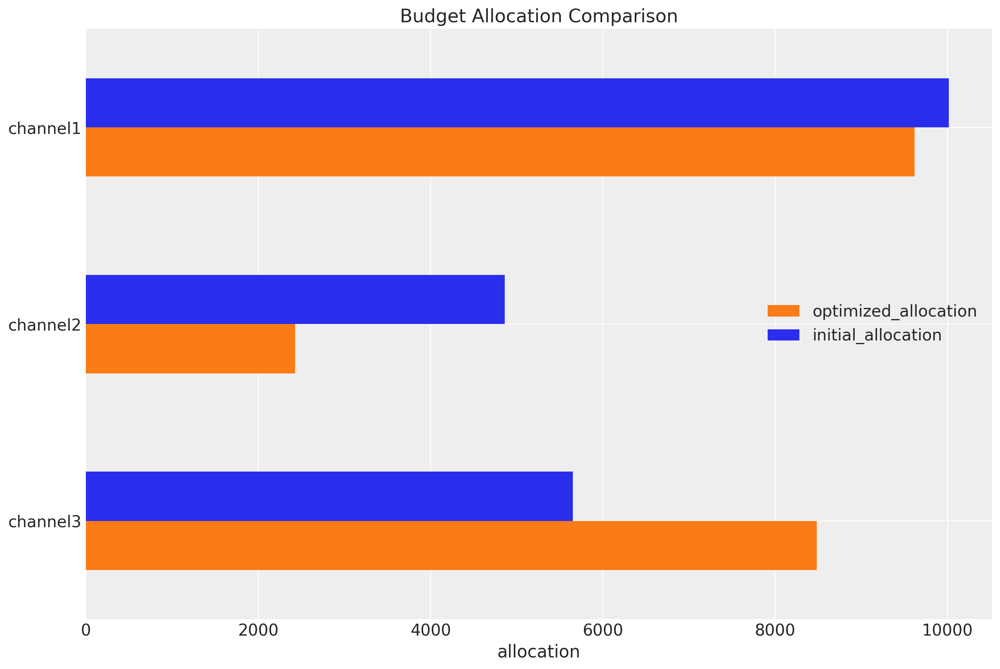

In [36]:
fig, ax = plt.subplots()

(
    pd.Series(allocation, index=mean_spend_per_period_test.index)
    .to_frame(name="optimized_allocation")
    .join(mean_spend_per_period_test.to_frame(name="initial_allocation"))
    .sort_index(ascending=False)
    .plot.barh(figsize=(12, 8), color=["C1", "C0"], ax=ax)
)
ax.set(title="Budget Allocation Comparison", xlabel="allocation");

In [40]:
# Calculate current spend per channel in X_test (total over test period)
current_spend = X_test[channel_columns].sum()

# Calculate optimized spend per channel (allocation_strategy * 15)
optimized_spend = allocation * num_periods

# Calculate total spend for percentage calculation
total_current_spend = current_spend.sum()
total_optimized_spend = optimized_spend.sum()

# Calculate spend percentages
current_spend_pct = (current_spend / total_current_spend) * 100
optimized_spend_pct = (optimized_spend / total_optimized_spend) * 100

# Combine into a DataFrame for comparison
spend_comparison = pd.DataFrame({
    "Current Spend (%)": current_spend_pct,
    "Optimized Spend (%)": optimized_spend_pct
})

print(spend_comparison)

          Current Spend (%)  Optimized Spend (%)
channel1          48.783994            46.851697
channel2          23.675706            11.837853
channel3          27.540300            41.310450


In [38]:
np.random.seed(42)
noise =np.random.normal(0, 0.01, size=(num_periods, len(channel_columns)))
channel_values=(allocation.to_pandas().values)*(1+noise)

data_dict = {mmm.date_column: X_test[mmm.date_column].values}
data_dict.update(dict(zip(channel_columns, channel_values.T, strict=False)))
dataset_optimized = pd.DataFrame(data_dict)

# Add control variables to the optimized dataset
for ctrl in controls:
    dataset_optimized[ctrl] = X_test[ctrl].values

dataset_optimized

,date,channel1,channel2,channel3,event_bf,event_summer
0,2025-09-22,9665.515021,2426.721065,8535.157491,0.0,0.0
1,2025-09-29,9764.223421,2424.390883,8460.376643,0.0,0.0
2,2025-10-06,9769.626953,2448.730286,8440.419483,0.0,0.0
3,2025-10-13,9669.924360,2418.819575,8440.737036,0.0,0.0
4,2025-10-20,9641.013641,2383.586740,8333.954966,0.0,0.0
5,2025-10-27,9563.662968,2405.468383,8506.880903,0.0,0.0
6,2025-11-03,9530.410917,2395.760876,8604.522416,0.0,0.0
7,2025-11-10,9596.027751,2431.721990,8359.410048,0.0,0.0
8,2025-11-17,9565.385006,2432.776509,8382.625074,0.0,0.0
9,2025-11-24,9653.876001,2415.484993,8455.495693,1.0,0.0


In [39]:
rng = np.random.default_rng(123)

response_optimal = mmm.sample_posterior_predictive(
    dataset_optimized,
    include_last_observations=True,
    original_scale=True,
    var_names=["y",'channel_contribution'],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

Sampling: [y]


In [40]:
rng = np.random.default_rng(123)

pred_test = mmm.sample_posterior_predictive(
    X_test,
    include_last_observations=True,
    original_scale=True,
    var_names=["y", "channel_contribution"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

Sampling: [y]


In [41]:
response_optimal_channel_contribution_original_scale = response_optimal["channel_contribution"].unstack().sum(dim="channel").transpose(..., "date")
pred_test_channel_contribution_original_scale = pred_test["channel_contribution"].unstack().sum(dim="channel").transpose(..., "date")

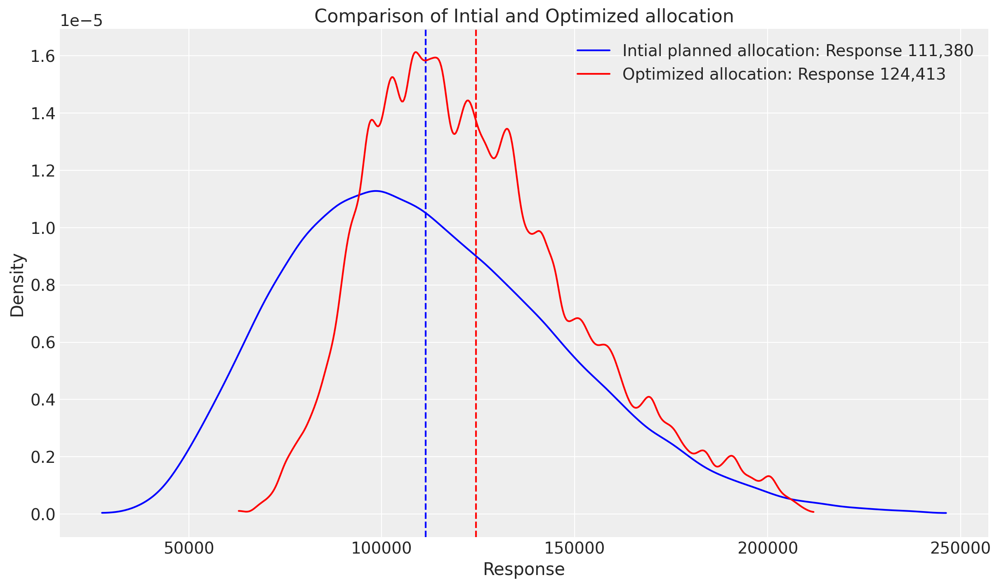

In [50]:
fig, ax = plt.subplots()

# Initial planned allocation
initial_data = pred_test_channel_contribution_original_scale.values.flatten()
initial_mean = initial_data.mean()
az.plot_dist(
    initial_data,
    # hdi_prob=0.75,
    color="blue",
    label=f"Intial planned allocation: Response {initial_mean:,.0f}",
    ax=ax,
    # kind="hist",
)
ax.axvline(initial_mean, color="blue", linestyle="--")

# Optimized allocation
optimized_data = response_optimal_channel_contribution_original_scale.values.flatten()
optimized_mean = optimized_data.mean()
az.plot_dist(
    optimized_data,
    # hdi_prob=0.75,
    color="red",
    label=f"Optimized allocation: Response {optimized_mean:,.0f}",
    ax=ax,
    # kind="hist",
)
ax.axvline(optimized_mean, color="red", linestyle="--")

ax.set_title("Comparison of Intial and Optimized allocation")
ax.set_xlabel("Response")
ax.set_ylabel("Density")
ax.legend()

plt.show()

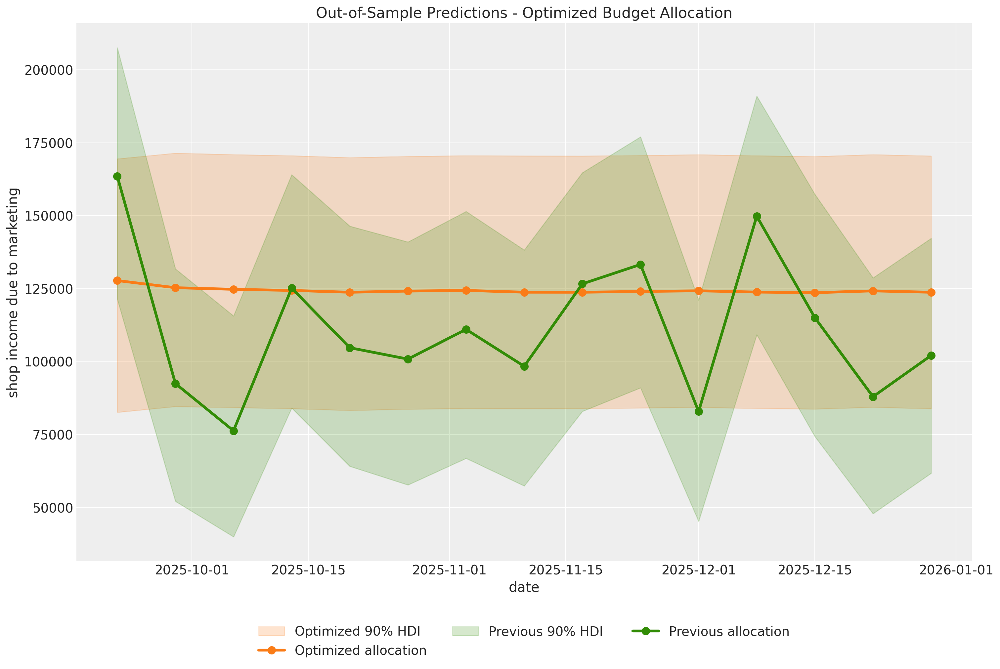

In [51]:
date_column = "date"

fig, ax = plt.subplots(figsize=(15, 10))

az.plot_hdi(
    X_test[date_column],
    response_optimal_channel_contribution_original_scale,
    hdi_prob=0.9,
    color="C1",
    fill_kwargs={"alpha": 0.2, "label": f"Optimized {0.90:.0%} HDI"},
    smooth=False,
    ax=ax,
)
# az.plot_hdi(
#     X_test[date_column],
#     response_channel_contribution_original_scale,
#     hdi_prob=0.5,
#     color="C1",
#     fill_kwargs={"alpha": 0.4, "label": f"Optimized {0.50:.0%} HDI (test)"},
#     smooth=False,
#     ax=ax,
# )
ax.plot(
    X_test[date_column],
    response_optimal_channel_contribution_original_scale.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Optimized allocation",
)

az.plot_hdi(
    X_test[date_column],
    pred_test_channel_contribution_original_scale,
    hdi_prob=0.9,
    color="C2",
    fill_kwargs={"alpha": 0.2, "label": f"Previous {0.90:.0%} HDI "},
    smooth=False,
    ax=ax,
)
# az.plot_hdi(
#     X_test[date_column],
#     pred_test_channel_contribution_original_scale,
#     hdi_prob=0.5,
#     color="C2",
#     fill_kwargs={"alpha": 0.4, "label": f"Naive {0.50:.0%} HDI (test)"},
#     smooth=False,
#     ax=ax,
# )
ax.plot(
    X_test[date_column],
    pred_test_channel_contribution_original_scale.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C2",
    linewidth=3,
    label="Previous allocation",
)

ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.20), ncol=3)

ax.set(
    title="Out-of-Sample Predictions - Optimized Budget Allocation",
    xlabel="date",
    ylabel="shop income due to marketing",
);

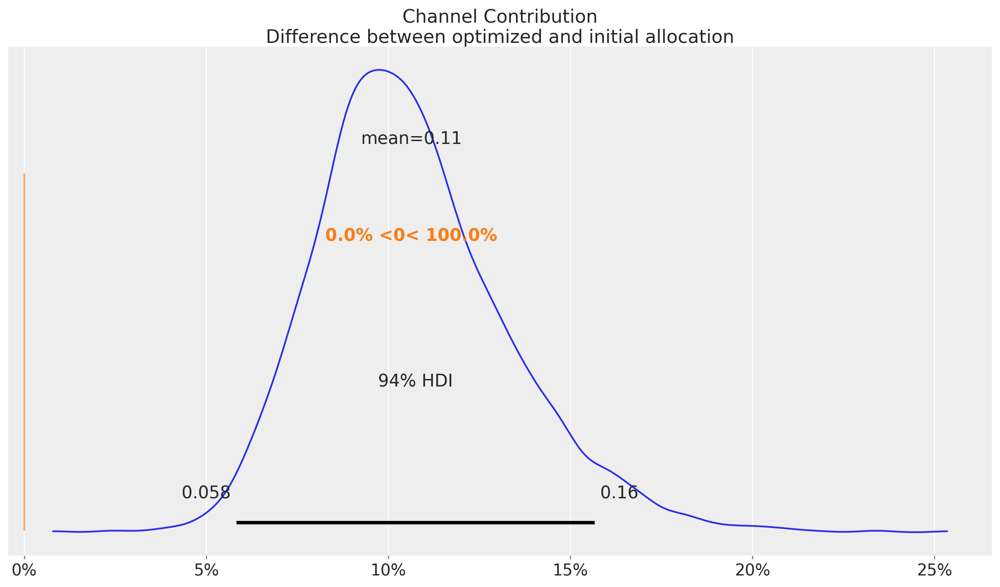

In [52]:
fig, ax = plt.subplots()
az.plot_posterior(
    (
        response_optimal_channel_contribution_original_scale.sum(dim="date")
        - pred_test_channel_contribution_original_scale.sum(dim="date")
    )
    / response_optimal_channel_contribution_original_scale.sum(dim="date"),
    ref_val=0,
    ax=ax,
)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set(
    title="Channel Contribution\nDifference between optimized and initial allocation"
);

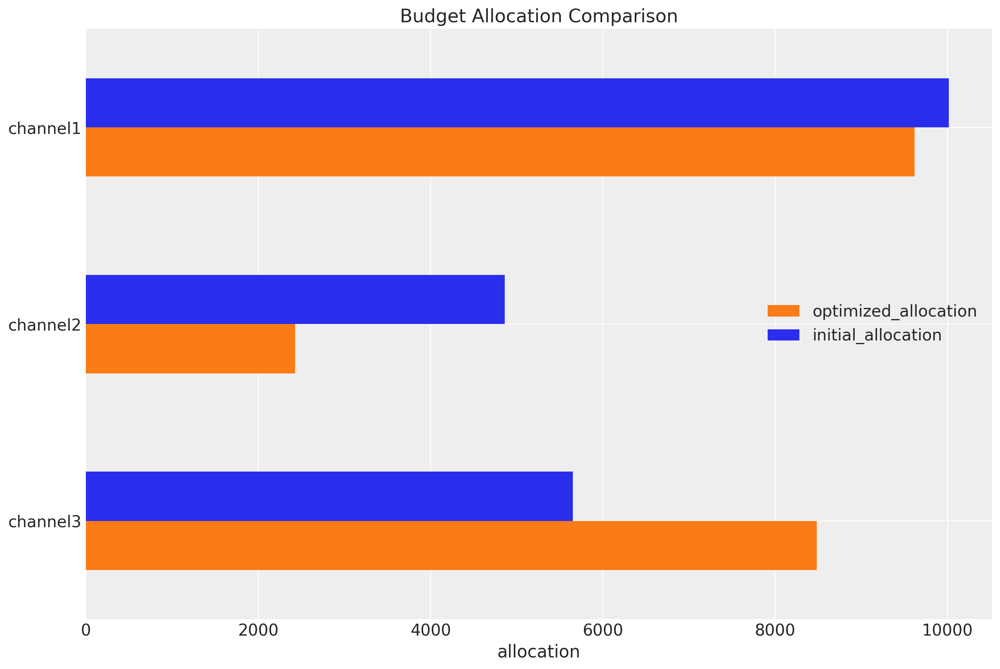

In [11]:
fig, ax = plt.subplots()

contribution_comparison_df = (
    pd.Series(allocation, index=mean_spend_per_period_test.index)
    .to_frame(name="optimized_allocation")
    .join(mean_spend_per_period_test.to_frame(name="initial_allocation"))
    .sort_index(ascending=False)
)
contribution_comparison_df.plot.barh(figsize=(12, 8), color=["C1", "C0"], ax=ax)
ax.set(title="Budget Allocation Comparison", xlabel="allocation");

In [12]:
shares_comparison_df = contribution_comparison_df / contribution_comparison_df.sum(
    axis=0
)

shares_comparison_df = shares_comparison_df.assign(
    # We can compute the multiplier as the ratio of the optimized to the initial allocation.
    # This will be used to re-weight the original training data.
    multiplier=lambda df: df["optimized_allocation"] / df["initial_allocation"]
)

shares_comparison_df

,optimized_allocation,initial_allocation,multiplier
channel3,0.413104,0.275403,1.500000
channel2,0.118379,0.236757,0.500000
channel1,0.468517,0.487840,0.960391


In [ ]:
X_test_weighted = X_test.copy()

# We re-weight the original test data with the optimized allocation distribution.
for channel in channel_columns:
    channel_multiplier = shares_comparison_df[shares_comparison_df.index == channel][
        "multiplier"
    ].item()
    X_test_weighted[channel] = X_test_weighted[channel] * channel_multiplier

# We normalize the total spend in the optimized data to be the same as in the original data.
normalization_factor = (
    X_test[channel_columns].sum().sum() / X_test_weighted[channel_columns].sum().sum()
)

# We apply the normalization factor to the optimized data.
X_test_weighted[channel_columns] = (
    X_test_weighted[channel_columns] * normalization_factor
)

# We validate that the total spend is the same as in the original data.
np.testing.assert_allclose(
    X_test_weighted[channel_columns].sum().sum(),
    X_test[channel_columns].sum().sum(),
)

In [56]:
X_test_weighted[channel_columns].sum().sum()

np.float64(307920.82999999996)

In [55]:
X_test[channel_columns].sum().sum()

np.float64(307920.82999999996)

In [57]:
dataset_optimized[channel_columns].sum().sum()

np.float64(307331.13324384554)

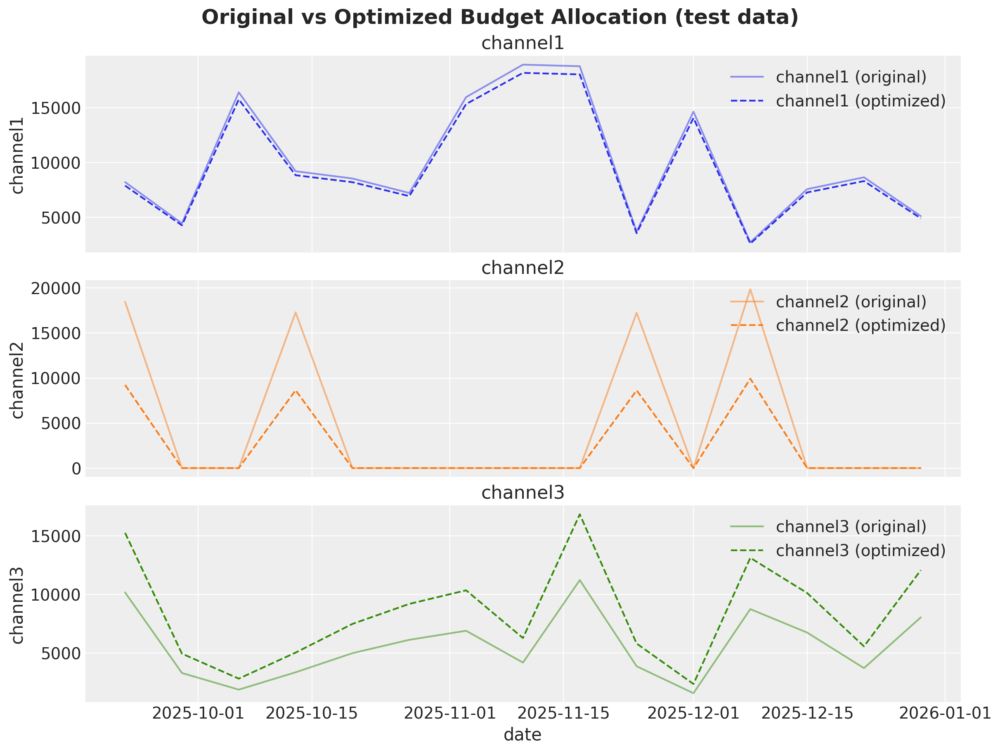

In [14]:
fig, axes = plt.subplots(
    nrows=n_channels,
    ncols=1,
    figsize=(12, 3 * n_channels),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, channel in enumerate(channel_columns):
    ax = axes[i]
    sns.lineplot(
        data=X_test,
        x=date_column,
        y=channel,
        color=f"C{i}",
        label=f"{channel} (original)",
        alpha=0.5,
        ax=ax,
    )
    sns.lineplot(
        data=X_test_weighted,
        x=date_column,
        y=channel,
        color=f"C{i}",
        linestyle="--",
        label=f"{channel} (optimized)",
        ax=ax,
    )
    ax.set(title=f"{channel}")

ax.set_xlabel("date")

fig.suptitle(
    "Original vs Optimized Budget Allocation (test data)",
    fontsize=18,
    fontweight="bold",
);

In [44]:
rng = np.random.default_rng(123)
y_pred_test = mmm.sample_posterior_predictive(
    X_test,
    var_names=["y", "channel_contribution"],
    include_last_observations=True,
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

y_pred_test_weighted = mmm.sample_posterior_predictive(
    X_test_weighted,
    var_names=["y", "channel_contribution"],
    include_last_observations=True,
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

Sampling: [y]
Sampling: [y]


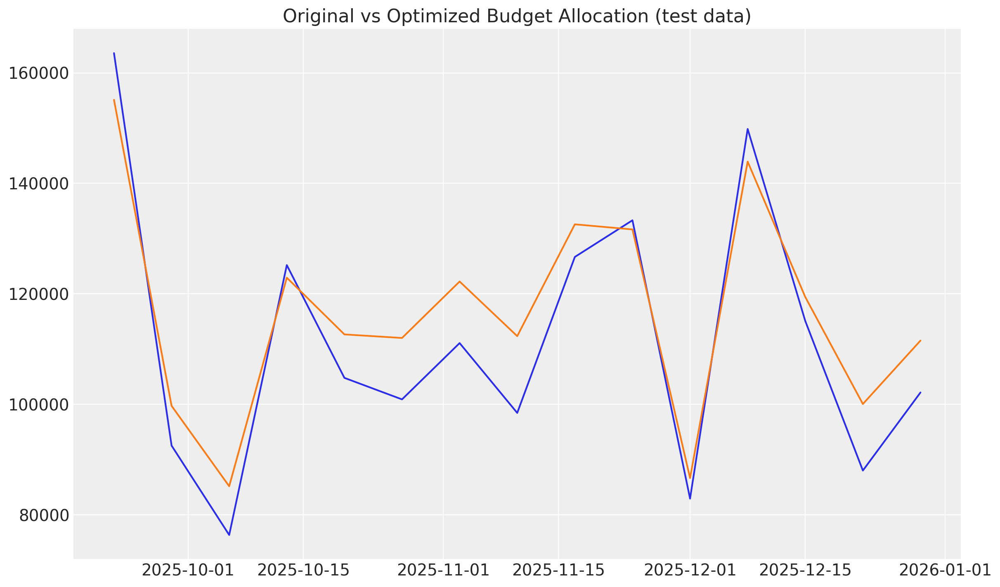

In [46]:
fig, ax = plt.subplots()

# az.plot_hdi(
#     y_pred_test.date,
#     y_pred_test["channel_contribution_original_scale"]
#     .unstack()
#     .transpose(..., "date")
#     .sum(dim="channel"),
#     smooth=False,
#     color="C0",
#     fill_kwargs={"alpha": 0.3},
#     ax=ax,
# )

ax.plot(
    y_pred_test.date,
    y_pred_test["channel_contribution"]
    .unstack()
    .transpose(..., "date")
    .sum(dim="channel")
    .mean(dim=("chain", "draw")),
    color="C0",
)

# az.plot_hdi(
#     y_pred_test_weighted.date,
#     y_pred_test_weighted["channel_contribution_original_scale"]
#     .unstack()
#     .transpose(..., "date")
#     .sum(dim="channel"),
#     smooth=False,
#     color="C1",
#     fill_kwargs={"alpha": 0.3},
#     ax=ax,
# )

ax.plot(
    y_pred_test_weighted.date,
    y_pred_test_weighted["channel_contribution"]
    .unstack()
    .transpose(..., "date")
    .sum(dim="channel")
    .mean(dim=("chain", "draw")),
    color="C1",
)

ax.set_title("Original vs Optimized Budget Allocation (test data)", fontsize=16);

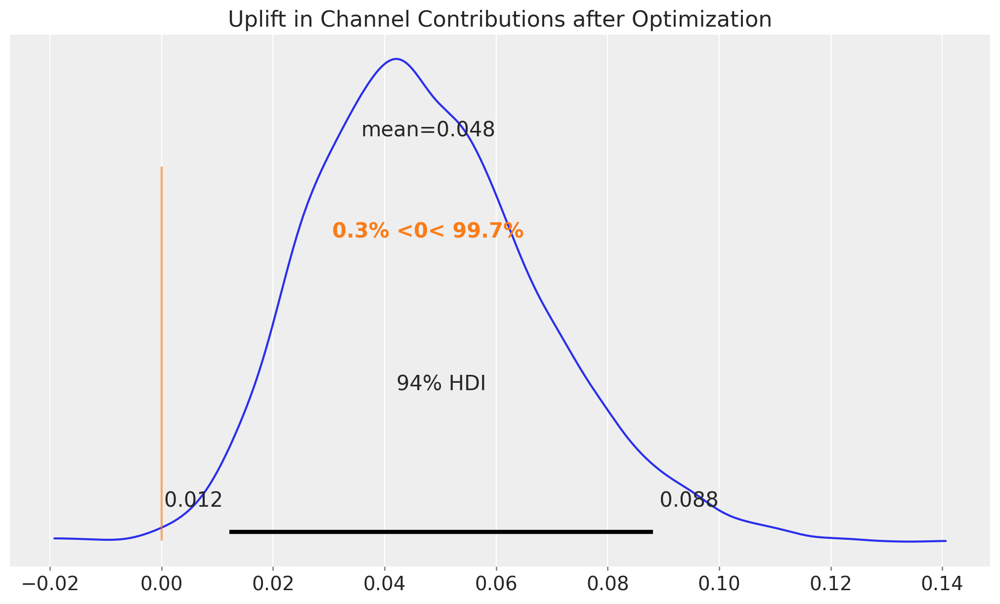

In [47]:
uplift = (
    y_pred_test_weighted["channel_contribution"]
    .sum(dim=("date", "channel"))
    .unstack()
    / y_pred_test["channel_contribution"]
    .sum(dim=("date", "channel"))
    .unstack()
) - 1

fig, ax = plt.subplots(figsize=(10, 6))
az.plot_posterior(
    uplift, var_names=["channel_contribution"], ref_val=0, ax=ax
)
ax.set_title("Uplift in Channel Contributions after Optimization", fontsize=16);

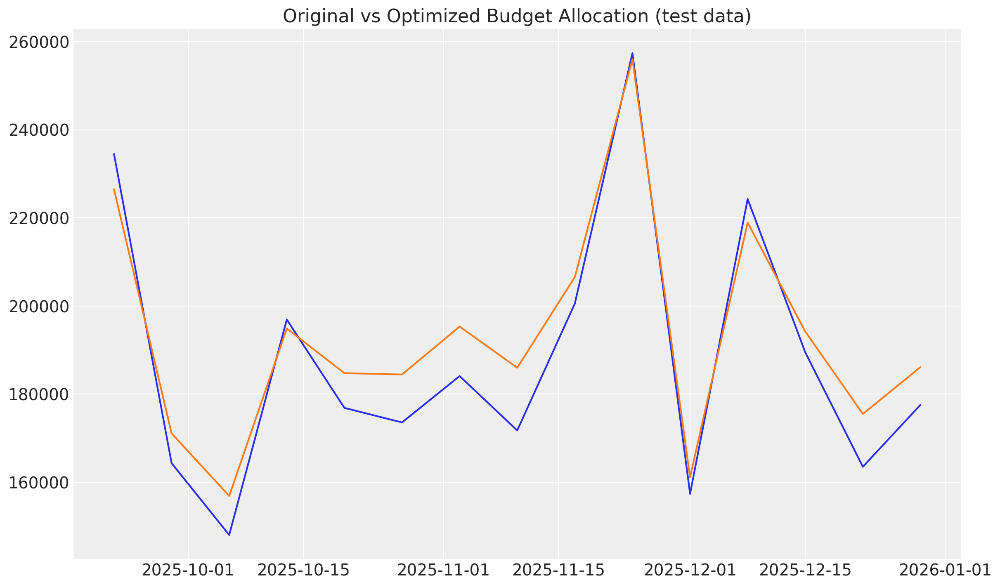

In [48]:
fig, ax = plt.subplots()

# az.plot_hdi(
#     y_pred_test.date,
#     y_pred_test["channel_contribution_original_scale"]
#     .unstack()
#     .transpose(..., "date")
#     .sum(dim="channel"),
#     smooth=False,
#     color="C0",
#     fill_kwargs={"alpha": 0.3},
#     ax=ax,
# )

ax.plot(
    y_pred_test.date,
    y_pred_test["y"]
    .unstack()
    .transpose(..., "date")
    .mean(dim=("chain", "draw")),
    color="C0",
)

# az.plot_hdi(
#     y_pred_test_weighted.date,
#     y_pred_test_weighted["channel_contribution_original_scale"]
#     .unstack()
#     .transpose(..., "date")
#     .sum(dim="channel"),
#     smooth=False,
#     color="C1",
#     fill_kwargs={"alpha": 0.3},
#     ax=ax,
# )

ax.plot(
    y_pred_test_weighted.date,
    y_pred_test_weighted["y"]
    .unstack()
    .transpose(..., "date")
    .mean(dim=("chain", "draw")),
    color="C1",
)

ax.set_title("Original vs Optimized Budget Allocation (test data)", fontsize=16);

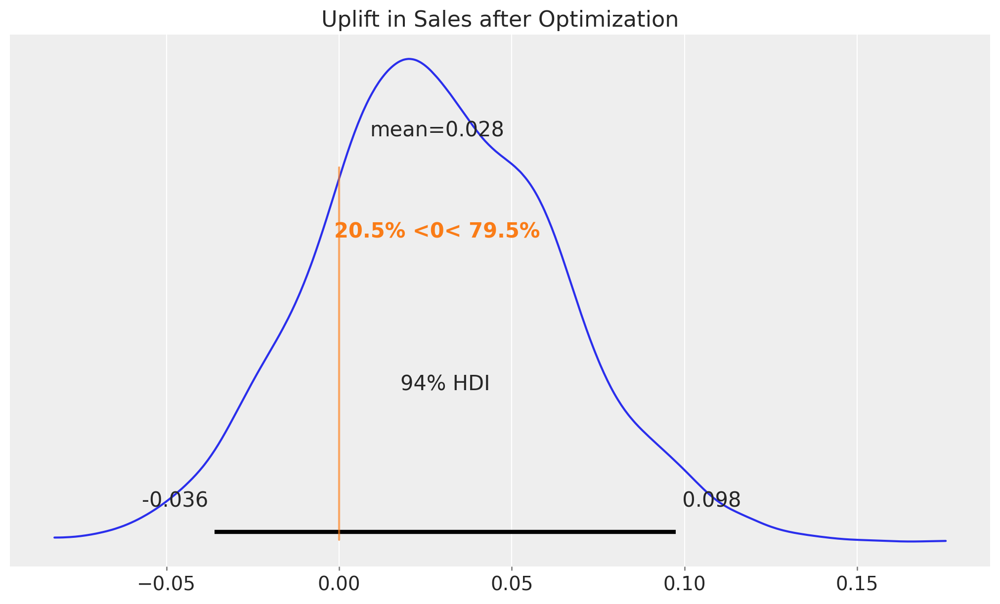

In [49]:
uplift = (
    y_pred_test_weighted["y"].sum(dim=("date")).unstack()
    / y_pred_test["y"].sum(dim=("date")).unstack()
) - 1

fig, ax = plt.subplots(figsize=(10, 6))
az.plot_posterior(uplift, var_names=["y"], ref_val=0, ax=ax)
ax.set_title("Uplift in Sales after Optimization", fontsize=16);

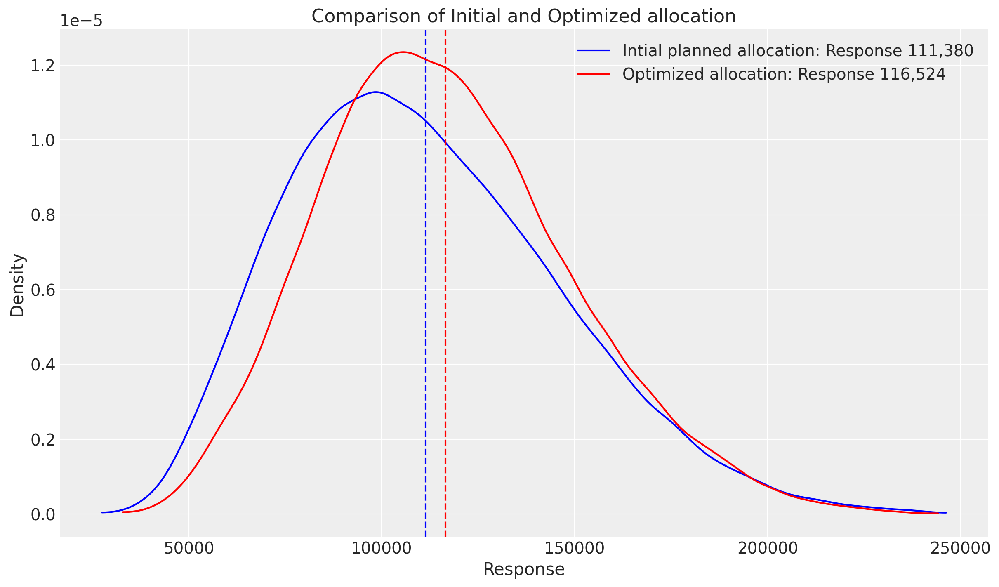

In [51]:
fig, ax = plt.subplots()

# Initial planned allocation
initial_data = y_pred_test["channel_contribution"].unstack().sum(dim=("channel")).transpose(..., "date").values.flatten()
initial_mean = initial_data.mean()
az.plot_dist(
    initial_data,
    # hdi_prob=0.75,
    color="blue",
    label=f"Intial planned allocation: Response {initial_mean:,.0f}",
    ax=ax,
    # kind="hist",
)
ax.axvline(initial_mean, color="blue", linestyle="--")

# Optimized allocation
optimized_data = y_pred_test_weighted["channel_contribution"].unstack().sum(dim=("channel")).transpose(..., "date").values.flatten()
optimized_mean = optimized_data.mean()
az.plot_dist(
    optimized_data,
    # hdi_prob=0.75,
    color="red",
    label=f"Optimized allocation: Response {optimized_mean:,.0f}",
    ax=ax,
    # kind="hist",
)
ax.axvline(optimized_mean, color="red", linestyle="--")

ax.set_title("Comparison of Initial and Optimized allocation")
ax.set_xlabel("Response")
ax.set_ylabel("Density")
ax.legend()

plt.show()

### Sales comparison

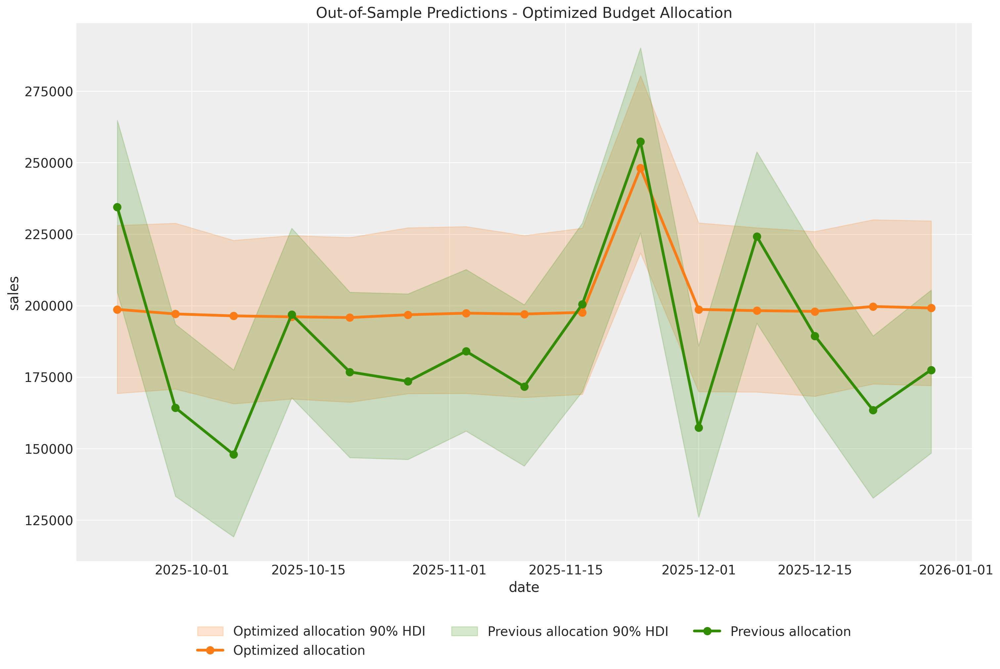

In [53]:
# y_response_original_scale = apply_sklearn_transformer_across_dim(
#     data=response["y"].unstack().transpose(..., "date"),
#     func=mmm.get_target_transformer().inverse_transform,
#     dim_name="date",
# )
date_column = "date" 
y_response_original_scale = response_optimal["y"].unstack().transpose(..., "date")

fig, ax = plt.subplots(figsize=(15, 10))

az.plot_hdi(
    X_test[date_column],
    y_response_original_scale,
    hdi_prob=0.9,
    color="C1",
    fill_kwargs={"alpha": 0.2, "label": f"Optimized allocation {0.9:.0%} HDI"},
    smooth=False,
    ax=ax,
)
# az.plot_hdi(
#     X_test[date_column],
#     y_response_original_scale,
#     hdi_prob=0.5,
#     color="C1",
#     fill_kwargs={"alpha": 0.4, "label": f"Optimized {0.50:.0%} HDI (test)"},
#     smooth=False,
#     ax=ax,
# )
ax.plot(
    X_test[date_column],
    y_response_original_scale.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Optimized allocation",
)

az.plot_hdi(
    X_test[date_column],
    pred_test["y"].unstack().transpose(..., "date"),
    hdi_prob=0.9,
    color="C2",
    fill_kwargs={"alpha": 0.2, "label": f"Previous allocation {0.9:.0%} HDI"},
    smooth=False,
    ax=ax,
)
# az.plot_hdi(
#     X_test[date_column],
#     pred_test["y"].unstack().transpose(..., "date"),
#     hdi_prob=0.5,
#     color="C2",
#     fill_kwargs={"alpha": 0.4, "label": f"Previous {0.50:.0%} HDI (test)"},
#     smooth=False,
#     ax=ax,
# )
ax.plot(
    X_test[date_column],
    pred_test["y"].unstack().transpose(..., "date").mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C2",
    linewidth=3,
    label="Previous allocation",
)

ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.20), ncol=3)

ax.set(
    title="Out-of-Sample Predictions - Optimized Budget Allocation",
    xlabel="date",
    ylabel="sales",
);

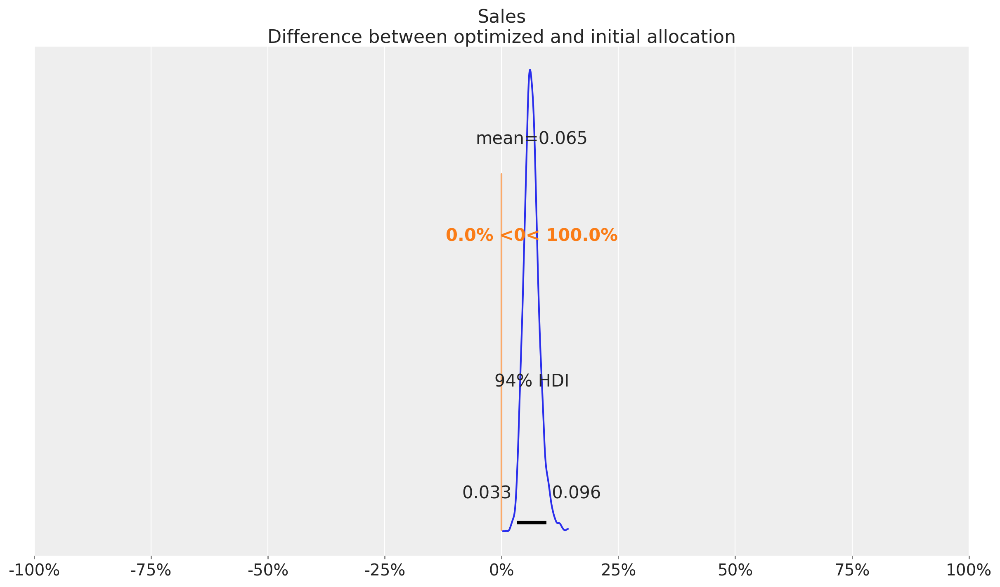

In [54]:
fig, ax = plt.subplots()
az.plot_posterior(
    (
        y_response_original_scale.sum(dim="date")
        - pred_test["y"].unstack().sum(dim="date")
    )
    / y_response_original_scale.sum(dim="date"),
    ref_val=0,
    ax=ax,
)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set(title="Sales\nDifference between optimized and initial allocation", xlim=(-1, 1));

## Save and load model

In [55]:
# Save the model
mmm.save("demo.nc")

In [4]:
# Load the model
mmm= MMM.load("demo.nc")